In [18]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf
import spacy
import nltk

In [19]:
from nltk.corpus import stopwords

In [3]:
nlp = spacy.load('ru_core_news_lg')

In [4]:
nltk.download('stopwords')

[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\slubo\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [5]:
df_data_science = pd.read_csv('C:\\Users\\slubo\\PycharmProjects\\diplom\\Data_Science.csv', encoding='utf-8', error_bad_lines=False)
df_data_engineer = pd.read_csv('C:\\Users\\slubo\\PycharmProjects\\diplom\\Data_Engineer.csv', encoding='utf_8', error_bad_lines=False)
df_product_manager = pd.read_csv('C:\\Users\\slubo\\PycharmProjects\\diplom\\Product_Manager.csv', encoding='utf_8', error_bad_lines=False)
df_smm_manager = pd.read_csv('C:\\Users\\slubo\\PycharmProjects\\diplom\\SMM_Manager.csv', encoding='utf_16', error_bad_lines=False)
df_marketing_manager = pd.read_csv('C:\\Users\\slubo\\PycharmProjects\\diplom\\Marketing_Manager.csv', encoding='utf_16', error_bad_lines=False)
df_frontend_developer = pd.read_csv('C:\\Users\\slubo\\PycharmProjects\\diplom\Frontend_Developer.csv', encoding='utf_16', error_bad_lines=False)
df_devops = pd.read_csv('C:\\Users\\slubo\\PycharmProjects\\diplom\DevOps.csv', encoding='utf_16', error_bad_lines=False)
df_backend_developer = pd.read_csv('C:\\Users\\slubo\\PycharmProjects\\diplom\BackEnd_Developer.csv', encoding='utf_16', error_bad_lines=False)

b'Skipping line 25: expected 10 fields, saw 23\nSkipping line 717: expected 10 fields, saw 25\n'
b'Skipping line 69: expected 10 fields, saw 11\n'
b'Skipping line 93: expected 10 fields, saw 19\nSkipping line 433: expected 10 fields, saw 62\nSkipping line 2217: expected 10 fields, saw 13\n'
b'Skipping line 115: expected 10 fields, saw 27\n'
b'Skipping line 29: expected 10 fields, saw 22\nSkipping line 1555: expected 10 fields, saw 32\n'
b'Skipping line 135: expected 10 fields, saw 21\nSkipping line 1239: expected 10 fields, saw 20\nSkipping line 1707: expected 10 fields, saw 12\nSkipping line 2485: expected 10 fields, saw 14\nSkipping line 2791: expected 10 fields, saw 15\n'


In [6]:
df_data_science.shape, df_data_engineer.shape, df_product_manager.shape, df_smm_manager.shape, df_marketing_manager.shape, df_frontend_developer.shape, df_devops.shape, df_backend_developer.shape

((575, 10),
 (335, 10),
 (1146, 10),
 (387, 10),
 (1052, 10),
 (1360, 10),
 (1420, 10),
 (1666, 10))

In [30]:
file = 'C:\\Users\\slubo\\PycharmProjects\\diplom\\Product_Manager.csv'
import chardet
with open(file, 'rb') as rawdata:
    result = chardet.detect(rawdata.read(100000))
result

{'encoding': 'utf-8', 'confidence': 0.99, 'language': ''}

In [69]:
df_devops = pd.read_csv('C:\\Users\\slubo\\PycharmProjects\\diplom\DevOps.csv', encoding='utf_16', error_bad_lines=False)

b'Skipping line 29: expected 10 fields, saw 22\nSkipping line 1555: expected 10 fields, saw 32\n'


In [8]:
df_frontend_developer

,name_vacancy,salary,name_company,location_company,location_company_link,required_experience,busyness,description,key_skills,vacancy_url
0,Frontend-разработчик (+PixiJS),от 80 000 руб. на руки,Арбина,"Пенза, Московская улица, 62",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","О нас Мы - небольшая команда из Пензы, которая...",HTML5 CSS3 React Less Sass Redux JavaScript CS,https://hh.ru/vacancy/55169215?from=vacancy_se...
1,Frontend-разработчик / HTML-верстальщик,з/п не указана,ООО Спортдата,"Восток, Минск, улица Петра Мстиславца, 9",https://hh.ru/search/vacancy/map?vacancy_id=50...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Минский офис международной компании, разрабаты...",HTML HTML5 CSS CSS3 JavaScript Reac,https://hh.ru/vacancy/50519573?from=vacancy_se...
2,Frontend-разработчик,от 1 200 до 1 800 USD на руки,ООО CAMBRIDGE GROUP,Ташкент,NaN,Требуемый опыт работы: более 6 лет,"Полная занятость, полный день",CAMBRIDGE Learning Centre - Это место где вы п...,Русский — C2 — В совершенстве Узбекский — C2 —...,https://hh.ru/vacancy/54974587?from=vacancy_se...
3,Frontend Game Developer (Кипр),з/п не указана,Невская Елизавета Сергеевна,город Лимасол,https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Наша молодая активная команда занимается разра...,NaN,https://hh.ru/vacancy/55091846?from=vacancy_se...
4,Frontend-разработчик (React.js),з/п не указана,ООО Спортдата,"Восток, Минск, улица Петра Мстиславца, 9",https://hh.ru/search/vacancy/map?vacancy_id=50...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Минский офис международной компании, разрабаты...",NaN,https://hh.ru/vacancy/50519545?from=vacancy_se...
...,...,...,...,...,...,...,...,...,...,...
1355,Frontend Developer (Angular),з/п не указана,ООО Перфект Арт,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Company Profile Perfect Art Group is the inter...,Английский — C1 — Продвинутый JavaScript HTML5...,https://hh.ru/vacancy/54794077?from=vacancy_se...
1356,Senior frontend-developer,з/п не указана,Сбер. IT,"Рязань, улица Семашко, 14",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Создание и развитие web-интерфейса собственной...,JavaScript HTML CSS Redux ReactJ,https://hh.ru/vacancy/54811266?from=vacancy_se...
1357,Team Lead Frontend,з/п не указана,ООО СберОбразование,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день","СберОбразование — компания экосистемы Сбер, ос...",JavaScript TypeScript Обучение TeamLead Reac,https://hh.ru/vacancy/54951899?from=vacancy_se...
1358,Front-end разработчик,з/п не указана,Сбер для экспертов,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Участвовать во всех фазах разработки.2 года оп...,NaN,https://hh.ru/vacancy/54876928?from=vacancy_se...


In [9]:
df_backend_developer['required_experience'] = df_backend_developer['required_experience'].replace(np.nan, '-')

In [10]:
df_backend_developer['busyness'] = df_backend_developer['busyness'].replace(np.nan, '-')

In [11]:
df_backend_developer['key_skills'] = df_backend_developer['key_skills'].replace(np.nan, '-')

In [12]:
df_backend_developer['all_feature_text'] = 'Название вакансии: ' + df_backend_developer['name_vacancy'].astype(str) + '. ' + 'Зарплата: ' + df_backend_developer['salary'].astype(str) + '. '\
                         + 'Название компании ' + df_backend_developer['name_company'].astype(str) + '. ' + 'Требуемый опыт ' + df_backend_developer['required_experience'].astype(str) + '. '\
                         + 'Занятость ' + df_backend_developer['busyness'].astype(str) + '. ' + 'Описание вакансии ' + df_backend_developer['description'].astype(str) + '. '\
                         + 'Ключевые навыки ' + df_backend_developer['key_skills'].astype(str) + '. '

In [22]:
nltk.stopwords.words("russian")

AttributeError: module 'nltk' has no attribute 'stopwords'

In [378]:
import unicodedata
from string import punctuation
russian_stopwords = stopwords.words("russian")
rdy_tmp = []
for i in range(0, len(df_backend_developer['all_feature_text'])):
    tmp_str = str()
    tmp = []
    doc = nlp(df_backend_developer['all_feature_text'][i])
    for token in doc:
        tmp.append(token.lemma_)
    tmp_str = ' '.join(tmp)
    tmp_str = unicodedata.normalize("NFKD", tmp_str)
    tmp_str = tmp_str.replace('   ', ' ')
    rdy_tmp.append(tmp_str)
    

In [379]:
rdy_tmp

['название вакансия : backend developer ( python ) . зарплата : з / п не указать . название компания тоо freedom mobile . требуемый опыт требуемый опыт работа : 3–6 год . занятость полный занятость , полный день . описание вакансия разработка ветка диалог в система . создание правило распознавание . скрипт - дизайнер даёт алгоритм построение разговор . после что требоваться с ... python . django / flask / fastapi [ один из фреймворков ] . регулярный выражение . изучить api партнёр в процесс работа . английский̆ язык .. ключевой навык javascript git css3 html5 linu .',
 'название вакансия : backend java developer ( middle / senior ) . зарплата : з / п не указать . название компания ооо сеуслаб . требуемый опыт требуемый опыт работа : 1–3 год . занятость полный занятость , полный день . описание вакансия обязанность : проектирование , разработка и рефакторинг высоконагруженных приложение в область big data для сбор , хранение и анализ данных из социальный сеть . требован

In [82]:
df_backend_developer['complete_text'] = rdy_tmp

In [14]:
df_backend_developer['all_feature_text'][0]

'Название вакансии: Backend Developer (Python). Зарплата: з/п не указана. Название компании ТОО\xa0FREEDOM MOBILE. Требуемый опыт Требуемый опыт работы: 3–6 лет. Занятость Полная занятость, полный день. Описание вакансии Разработка ветки диалога в системе. Создание правил распознавания. Скрипт-дизайнер даёт алгоритм построения разговора. После чего требуется с...Python. Django/Flask/FastAPI [один из фреймворков]. Регулярные выражения. Изучить API партнёра в процессе работы. Английский̆ язык.. Ключевые навыки JavaScript Git CSS3 HTML5 Linu. '

In [12]:
len(df_data_science['all_feature_text'])

575

In [220]:
df_train['complete_text_data_science'] = lemm_text(df_data_science['all_feature_text'])


ValueError: Length of values (575) does not match length of index (1146)

In [ ]:
def lemm_text(text):
    import unicodedata
    from string import punctuation
    russian_stopwords = stopwords.words("russian")
    rdy_tmp = []
    for i in range(0, len(text)):
        tmp_str = str()
        tmp = []
        doc = nlp(text[i])
        for token in doc:
            tmp.append(token.lemma_)
        tmp_str = ' '.join(tmp)
        tmp_str = unicodedata.normalize("NFKD", tmp_str)
        tmp_str = tmp_str.replace('   ', ' ')
        rdy_tmp.append(tmp_str)
    return rdy_tmp

In [ ]:
def preprocess_text(text):
    tokens = mystem.lemmatize(text.lower())
    tokens = [token for token in tokens if token not in russian_stopwords\
              and token != " " \
              and token.strip() not in punctuation]
    
    text = " ".join(tokens)
    return text

In [114]:
df_product_manager

,name_vacancy,salary,name_company,location_company,location_company_link,required_experience,busyness,description,key_skills,vacancy_url,all_feature_text,complete_text
0,Продакт-менеджер,от 10 000 000 до 15 000 000 сум на руки,OOO NATURAL JUICE,"Ташкент, 3-й проезд Ниезбек Йули, 4",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Мы предлагаем: Пятидневная рабочая неделя Раб...,Русский — C2 — В совершенстве Маркетинговый ан...,https://hh.ru/vacancy/55226325?from=vacancy_se...,Название вакансии: Продакт-менеджер. Зарплата:...,название вакансия : продакт - менеджер . зарпл...
1,Product Manager (размещение заказов на произво...,от 200 000 руб. на руки,ООО ЖэТэ-Транс Лимитед,"Красносельская, Москва, Спартаковский переулок...",https://hh.ru/search/vacancy/map?vacancy_id=48...,Требуемый опыт работы: более 6 лет,"Полная занятость, полный день",Для иностранного бренда молодежной марки одежд...,-,https://hh.ru/vacancy/48954023?from=vacancy_se...,Название вакансии: Product Manager (размещение...,название вакансия : product manager ( размещен...
2,Product Manager в международный проект,от 220 000 до 250 000 руб. на руки,Мирафокс,Москва,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, удаленная работа",Компания Mirafox приглашает в команду талантли...,-,https://hh.ru/vacancy/55185964?from=vacancy_se...,Название вакансии: Product Manager в междунаро...,название вакансия : product manager в междунар...
3,Менеджер продукта,з/п не указана,ООО СЕУСЛАБ,"Пермь, шоссе Космонавтов, 111к3",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Обязанности: Отвечает за создание и эксплуата...,Постановка задач разработчикам Agile Project M...,https://hh.ru/vacancy/55196606?from=vacancy_se...,Название вакансии: Менеджер продукта. Зарплата...,название вакансия : менеджер продукт . зарплат...
4,Product manager,з/п не указана,Jivo,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, удаленная работа",Кто мы?Jivo - международная продуктовая компан...,Product Management Управление проектами Разраб...,https://hh.ru/vacancy/55191153?from=vacancy_se...,Название вакансии: Product manager. Зарплата: ...,название вакансия : product manager . зарплата...
...,...,...,...,...,...,...,...,...,...,...,...,...
1141,Продакт-менеджер,от 1 500 EUR на руки,Иностр. п. Представительство ALPEN PHARMA AG в РБ,минск,https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Представительство европейской фармацевтической...,-,https://hh.ru/vacancy/54957032?from=vacancy_se...,Название вакансии: Продакт-менеджер. Зарплата:...,название вакансия : продакт - менеджер . зарпл...
1142,Продакт менеджер APC,з/п не указана,ООО MUK International,Армения,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Требования: Высшее техническое образование; О...,Организация мероприятий Анализ ценообразования...,https://hh.ru/vacancy/54927815?from=vacancy_se...,Название вакансии: Продакт менеджер APC. Зарпл...,название вакансия : продакт менеджер apc . зар...
1143,Продакт менеджер Juniper,з/п не указана,ТОО «Мук-Компьютерс»,Алматы,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Требования: Высшее техническое образование; З...,Английский — B1 — Средний Грамотная речь Прове...,https://hh.ru/vacancy/54923394?from=vacancy_se...,Название вакансии: Продакт менеджер Juniper. З...,название вакансия : продакт менеджер juniper ....
1144,Brand executive (продакт менеджер),з/п не указана,Представительство компании ГЕТЕРО ЛАБС ЛИМИТЕД...,Бишкек,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Обязанности: Планирование и контроль маркетин...,Английский — B1 — Средний Организация мероприя...,https://hh.ru/vacancy/54683931?from=vacancy_se...,Название вакансии: Brand executive (продакт ме...,название вакансия : brand executive ( продакт ...


In [20]:
from sklearn.feature_extraction.text import TfidfVectorizer, CountVectorizer
from sklearn.decomposition import TruncatedSVD

In [171]:
count_vect = CountVectorizer()
bow1 = count_vect.fit_transform(df_product_manager['complete_text'].values)
bow = bow1.todense()

In [196]:
svd = TruncatedSVD(n_components=10, n_iter=7)
X_2d = svd.fit_transform(bow)

In [197]:
X_2d

array([[14.11105236, -1.58326299, -1.16971404, ...,  1.36710319,
        -0.357818  ,  0.44627072],
       [ 9.76420984, -0.03872038, -3.85323789, ..., -1.35350037,
        -1.12236289,  2.15941171],
       [18.29173987, -0.604332  ,  4.16529065, ...,  2.26051759,
        -0.16257689,  0.14065345],
       ...,
       [ 8.18302675, -0.20771458, -4.08367062, ..., -0.27362228,
         0.9937539 ,  2.1385393 ],
       [ 9.87804708, -0.38130018, -4.43399371, ...,  0.09868625,
         2.39417843, -0.33807572],
       [22.12835808, -2.56099525, -6.95808613, ..., -1.84352958,
         4.07921178, -0.45415292]])

In [104]:
from sklearn.cluster import KMeans

In [531]:
kmeans_cluster = KMeans(n_clusters=40, max_iter=100).fit(X_2d)

In [201]:
df_product_manager['cluster_number_kmean'] = kmeans_cluster.labels_

In [532]:
kmeans_cluster.labels_

array([29, 18, 21, ...,  2,  2, 23])

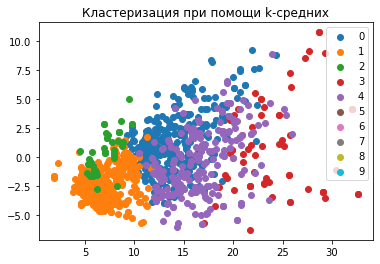

In [200]:
for i in [0,1,2,3,4,5,6,7,8,9]:
    plt.scatter(X_2d[kmeans_cluster.labels_ == i , 0], X_2d[kmeans_cluster.labels_ == i , 4], label = i)
plt.legend()
plt.title('Кластеризация при помощи k-средних')
plt.show()

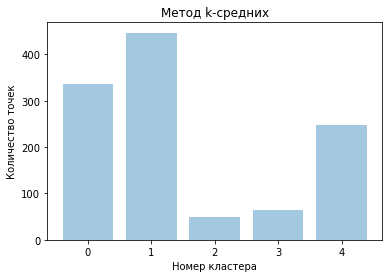

In [204]:
import matplotlib.pyplot as plt
plt.bar([x for x in range(5)], df_product_manager.groupby(['cluster_number_kmean'])['all_feature_text'].count(), alpha = 0.4)
plt.title('Метод k-средних')
plt.xlabel("Номер кластера")
plt.ylabel("Количество точек")
plt.show()

In [209]:
df_train = pd.DataFrame({'complete_text_product_manager': df_product_manager['complete_text']})


In [210]:
df_train

,complete_text_product_manager
0,название вакансия : продакт - менеджер . зарпл...
1,название вакансия : product manager ( размещен...
2,название вакансия : product manager в междунар...
3,название вакансия : менеджер продукт . зарплат...
4,название вакансия : product manager . зарплата...
...,...
1141,название вакансия : продакт - менеджер . зарпл...
1142,название вакансия : продакт менеджер apc . зар...
1143,название вакансия : продакт менеджер juniper ....
1144,название вакансия : brand executive ( продакт ...


In [259]:
df_backend_developer['complete_text'] = lemm_text(df_backend_developer['all_feature_text'])

In [71]:
df_backend_developer['all_feature_text'][0]

'Название вакансии: Backend Developer (Python). Зарплата: з/п не указана. Название компании ТОО\xa0FREEDOM MOBILE. Требуемый опыт Требуемый опыт работы: 3–6 лет. Занятость Полная занятость, полный день. Описание вакансии Разработка ветки диалога в системе. Создание правил распознавания. Скрипт-дизайнер даёт алгоритм построения разговора. После чего требуется с...Python. Django/Flask/FastAPI [один из фреймворков]. Регулярные выражения. Изучить API партнёра в процессе работы. Английский̆ язык.. Ключевые навыки JavaScript Git CSS3 HTML5 Linu. '

In [84]:
df_train_last = pd.DataFrame({})

In [85]:
df_train_last['all_texts'] = df_data_science['complete_text']

In [86]:
df_train_last['number_profession'] = 1

In [87]:
df_train_last

,all_texts,number_profession
0,название вакансия : machine learning engineer ...,1
1,название вакансия : разработчик machine learni...,1
2,название вакансия : machine learning engineer ...,1
3,название вакансия : machine learning and compu...,1
4,название вакансия : data scientist / machine l...,1
...,...,...
570,название вакансия : системный аналитик в кома...,1
571,название вакансия : системный аналитик ( прое...,1
572,название вакансия : старший системный аналит...,1
573,название вакансия : клиентский аналитик/ seni...,1


In [285]:
df_train_last['all_texts'].append(df_data_engineer['complete_text'], ingore_index=True)
df_train_last['number_profession'].append(2, ingore_index=True)

TypeError: append() got an unexpected keyword argument 'ingore_index'

In [100]:
for i in df_backend_developer['complete_text']:
    df_train_last.loc[len(df_train_last)] = [i, 8]

In [101]:
df_train_last

,all_texts,number_profession
0,название вакансия : machine learning engineer ...,1
1,название вакансия : разработчик machine learni...,1
2,название вакансия : machine learning engineer ...,1
3,название вакансия : machine learning and compu...,1
4,название вакансия : data scientist / machine l...,1
...,...,...
7936,название вакансия : тимлид группа бэкенд разра...,8
7937,название вакансия : программис / back - end ph...,8
7938,название вакансия : full stack ( frond - end /...,8
7939,название вакансия : бэк энд разработчик . зарп...,8


In [105]:
count_vect = CountVectorizer()
bow1 = count_vect.fit_transform(df_train_last['all_texts'].values)
bow = bow1.todense()

In [106]:
bow

matrix([[0, 1, 0, ..., 0, 0, 0],
        [0, 2, 0, ..., 0, 0, 0],
        [0, 0, 0, ..., 0, 0, 0],
        ...,
        [0, 2, 0, ..., 0, 0, 0],
        [0, 4, 0, ..., 0, 0, 0],
        [2, 0, 0, ..., 0, 0, 0]], dtype=int64)

In [107]:
svd = TruncatedSVD(n_components=10, n_iter=7)
X_2d = svd.fit_transform(bow)

C:\Users\slubo\anaconda3\lib\site-packages\sklearn\utils\validation.py:723: FutureWarning: np.matrix usage is deprecated in 1.0 and will raise a TypeError in 1.2. Please convert to a numpy array with np.asarray. For more information see: https://numpy.org/doc/stable/reference/generated/numpy.matrix.html
  warnings.warn(


In [108]:
X_2d

array([[ 7.09197561, 21.33490684, -1.47202302, ...,  0.04413575,
         1.72406991,  1.25774664],
       [10.80845517, -0.57005005, -2.64268356, ...,  0.59355734,
         1.85853877, -0.06211258],
       [23.53628849, -2.07365422, -0.94758052, ...,  4.35152819,
         6.47540733, -6.14260961],
       ...,
       [ 7.91762703, -0.41429453, -2.18963183, ..., -0.12156905,
        -0.14711314,  1.19899835],
       [ 7.2546985 , -0.16510323, -3.36057524, ..., -0.67185058,
        -0.48824413,  1.24494625],
       [21.96141018, -1.53794969, -7.23146106, ...,  2.95042213,
         5.65127511,  0.17534427]])

In [109]:
kmeans_cluster = KMeans(n_clusters=40).fit(X_2d)

In [110]:
kmeans_cluster.labels_

array([ 1,  3, 21, ..., 34, 15, 10])

In [111]:
df_train_last['cluster_number_kmean'] = kmeans_cluster.labels_

In [ ]:
kmeans_cluster.labels_

<ipython-input-112-5ba4998e8708>:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, 5, i+1)


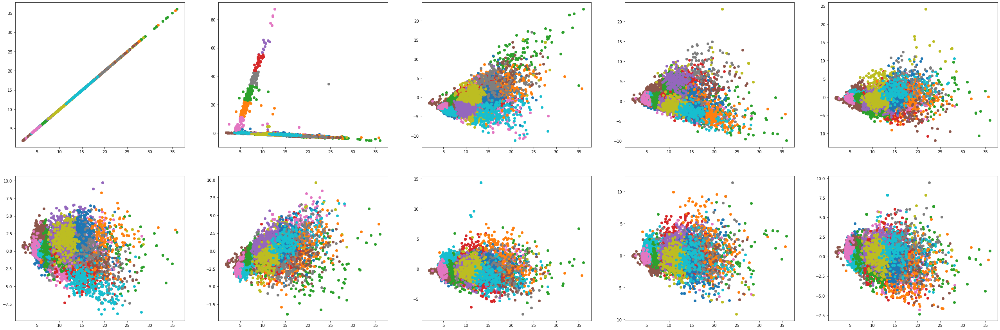

In [112]:
figsize = (45, 15)
plt.figure(figsize=figsize)
for i in range(10):
    for j in range(40):
        plt.subplot(2, 5, i+1)
        plt.scatter(X_2d[kmeans_cluster.labels_ == j , 0], X_2d[kmeans_cluster.labels_ == j , i], label = j)
        

<ipython-input-345-ff1d5816c2c6>:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, 5, i+1)


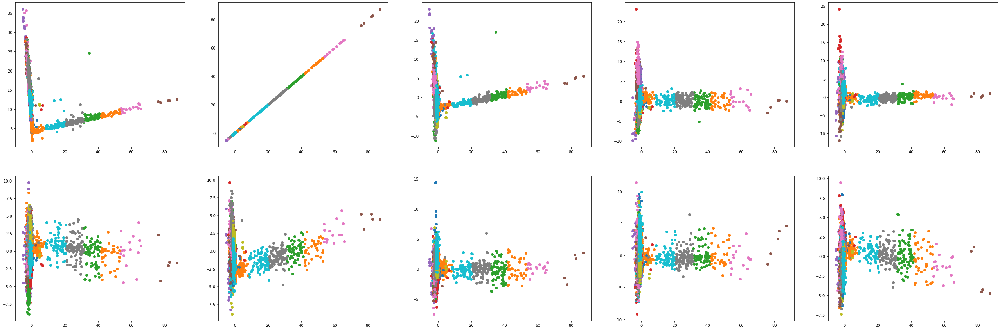

In [345]:
figsize = (45, 15)
plt.figure(figsize=figsize)
for i in range(10):
    for j in range(40):
        plt.subplot(2, 5, i+1)
        plt.scatter(X_2d[kmeans_cluster.labels_ == j , 1], X_2d[kmeans_cluster.labels_ == j , i], label = j)

<ipython-input-346-be448adfb20b>:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, 5, i+1)


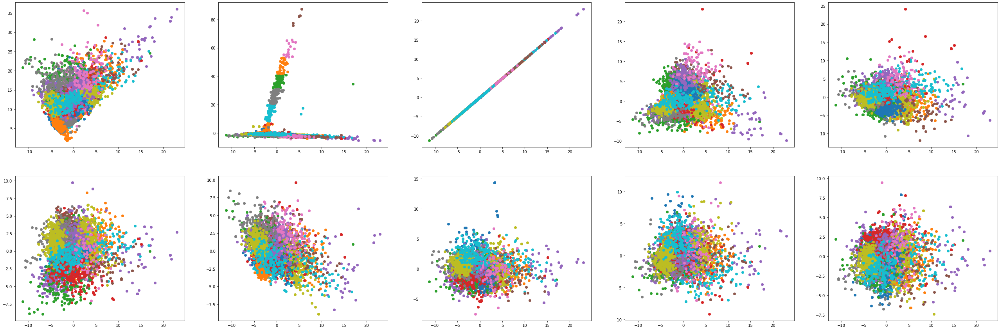

In [346]:
figsize = (45, 15)
plt.figure(figsize=figsize)
for i in range(10):
    for j in range(40):
        plt.subplot(2, 5, i+1)
        plt.scatter(X_2d[kmeans_cluster.labels_ == j , 2], X_2d[kmeans_cluster.labels_ == j , i], label = j)

In [1]:
figsize = (45, 15)
plt.figure(figsize=figsize)
for i in range(10):
    for j in range(40):
        plt.subplot(2, 5, i+1)
        plt.scatter(X_2d[kmeans_cluster.labels_ == j , 3], X_2d[kmeans_cluster.labels_ == j , i], label = j)

NameError: name 'plt' is not defined

<ipython-input-348-0678d5d7c177>:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, 5, i+1)


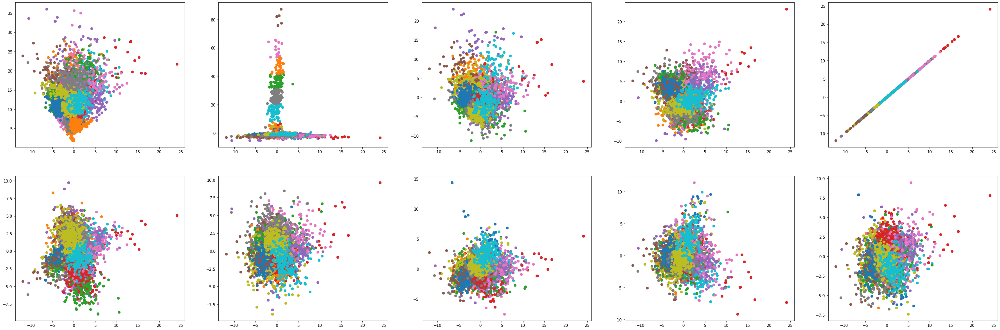

In [348]:
figsize = (45, 15)
plt.figure(figsize=figsize)
for i in range(10):
    for j in range(40):
        plt.subplot(2, 5, i+1)
        plt.scatter(X_2d[kmeans_cluster.labels_ == j , 4], X_2d[kmeans_cluster.labels_ == j , i], label = j)

<ipython-input-349-506d8cb81058>:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, 5, i+1)


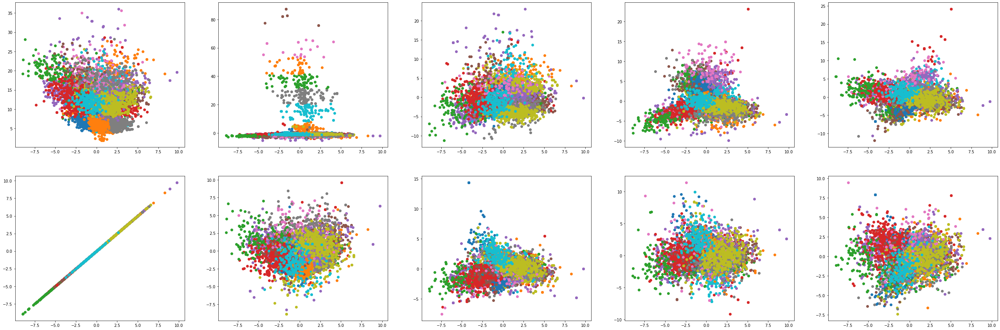

In [349]:
figsize = (45, 15)
plt.figure(figsize=figsize)
for i in range(10):
    for j in range(40):
        plt.subplot(2, 5, i+1)
        plt.scatter(X_2d[kmeans_cluster.labels_ == j , 5], X_2d[kmeans_cluster.labels_ == j , i], label = j)

<ipython-input-350-452074e6ddde>:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, 5, i+1)


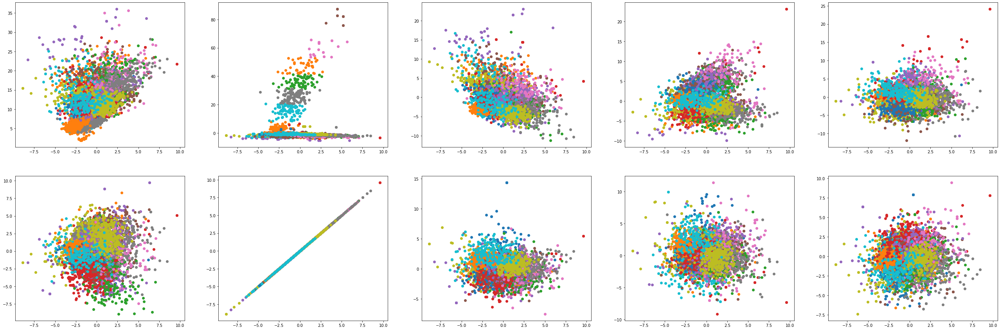

In [350]:
figsize = (45, 15)
plt.figure(figsize=figsize)
for i in range(10):
    for j in range(40):
        plt.subplot(2, 5, i+1)
        plt.scatter(X_2d[kmeans_cluster.labels_ == j , 6], X_2d[kmeans_cluster.labels_ == j , i], label = j)

<ipython-input-351-6cf471ea49e9>:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, 5, i+1)


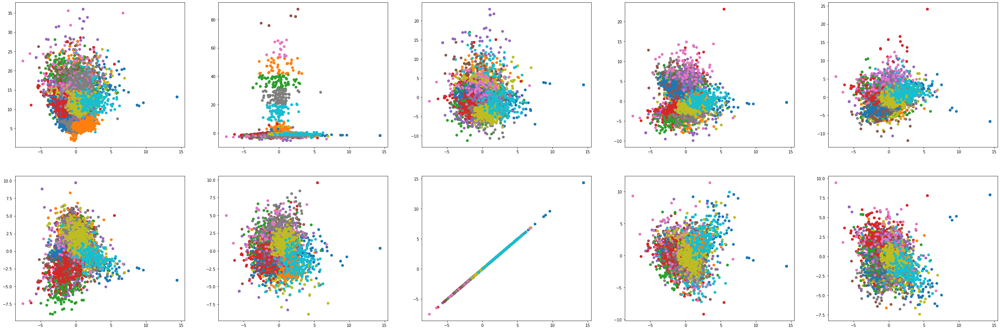

In [351]:
figsize = (45, 15)
plt.figure(figsize=figsize)
for i in range(10):
    for j in range(40):
        plt.subplot(2, 5, i+1)
        plt.scatter(X_2d[kmeans_cluster.labels_ == j , 7], X_2d[kmeans_cluster.labels_ == j , i], label = j)

<ipython-input-353-560d987e4097>:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, 5, i+1)


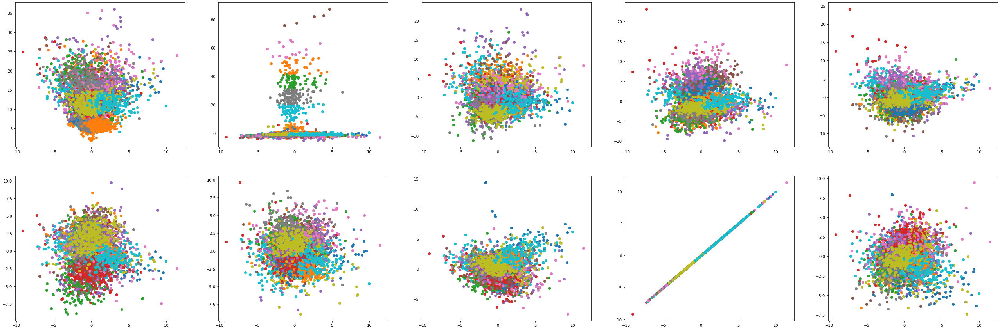

In [353]:
figsize = (45, 15)
plt.figure(figsize=figsize)
for i in range(10):
    for j in range(40):
        plt.subplot(2, 5, i+1)
        plt.scatter(X_2d[kmeans_cluster.labels_ == j , 8], X_2d[kmeans_cluster.labels_ == j , i], label = j)

<ipython-input-354-b84477b46bbb>:5: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2, 5, i+1)


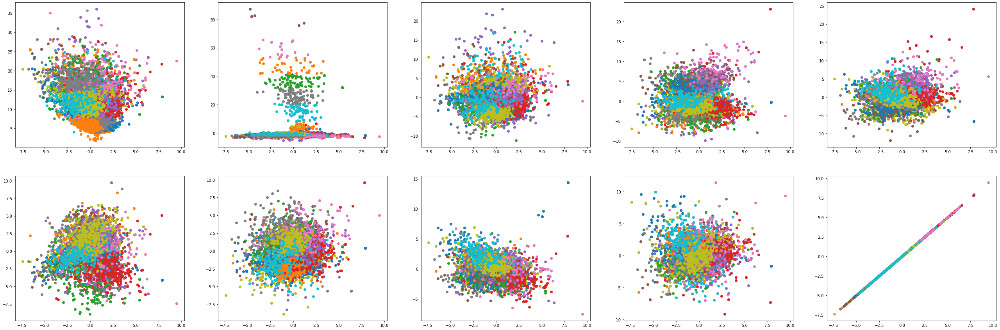

In [354]:
figsize = (45, 15)
plt.figure(figsize=figsize)
for i in range(10):
    for j in range(40):
        plt.subplot(2, 5, i+1)
        plt.scatter(X_2d[kmeans_cluster.labels_ == j , 9], X_2d[kmeans_cluster.labels_ == j , i], label = j)

In [ ]:
n = 20

# visualize the clusters by first n dimensions (reduced)
fig, ax = plt.subplots(n, n, sharex=True, sharey=True, figsize=(15,15))
fig.tight_layout(rect=[0.05, 0.05, 0.95, 0.95])

# plot it
k = 0
for i in range(0,n):
    for j in range(0,n):
        if i != j:
            df_plot.plot(kind = 'scatter', x=j, y=i, c=df_train_last[''], ax = ax[i][j], fontsize = 18)
        else:
            ax[i][j].set_xlabel(i)
            ax[i][j].set_ylabel(j)
            ax[i][j].set_frame_on(False)
        ax[i][j].set_xticks([])
        ax[i][j].set_yticks([])
        
plt.suptitle('2D clustering view of the first {} components'.format(n), fontsize = 20)
fig.text(0.5, 0.01, 'Component n', ha='center', fontsize = 18)
fig.text(0.01, 0.5, 'Component n', va='center', rotation='vertical', fontsize = 18)

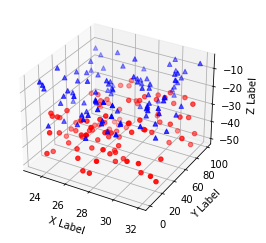

In [355]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np


def randrange(n, vmin, vmax):
    '''
    Helper function to make an array of random numbers having shape (n, )
    with each number distributed Uniform(vmin, vmax).
    '''
    return (vmax - vmin)*np.random.rand(n) + vmin

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

n = 100

# For each set of style and range settings, plot n random points in the box
# defined by x in [23, 32], y in [0, 100], z in [zlow, zhigh].
for c, m, zlow, zhigh in [('r', 'o', -50, -25), ('b', '^', -30, -5)]:
    xs = randrange(n, 23, 32)
    ys = randrange(n, 0, 100)
    zs = randrange(n, zlow, zhigh)
    ax.scatter(xs, ys, zs, c=c, marker=m)

ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')

plt.show()

In [360]:
df_train_last

,all_texts,number_profession,cluster_number_kmean
0,название вакансия : machine learning engineer ...,1,17
1,название вакансия : разработчик machine learni...,1,16
2,название вакансия : machine learning engineer ...,1,0
3,название вакансия : machine learning and compu...,1,0
4,название вакансия : data scientist / machine l...,1,18
...,...,...,...
7936,название вакансия : тимлид группа бэкенд разра...,8,37
7937,название вакансия : программис / back - end ph...,8,38
7938,название вакансия : full stack ( frond - end /...,8,16
7939,название вакансия : бэк энд разработчик . зарп...,8,27


In [596]:
import plotly.express as px
import plotly.graph_objects as go
fig = go.Figure(data=[go.Scatter3d(x=X_2d[kmeans_cluster.labels_ == 8 , 0], y=X_2d[kmeans_cluster.labels_ == 9 , 1], z=X_2d[kmeans_cluster.labels_ == 10 , 2], mode='markers'
)])
fig.show()

In [21]:
from sklearn.cluster import AgglomerativeClustering
from sklearn.cluster import DBSCAN
from sklearn.cluster import OPTICS


In [22]:
from sklearn.cluster import Birch

In [476]:
clustering = AgglomerativeClustering(n_clusters=40).fit(X_2d)


In [477]:
clustering.labels_

array([28, 12, 26, ...,  0,  0, 10], dtype=int64)

In [492]:
clustering_dbscan = DBSCAN(eps=5, min_samples=5).fit(X_2d)

In [493]:
set(clustering_dbscan.labels_)

{-1, 0, 1, 2, 3, 4}

In [496]:
clustering_optics = OPTICS(min_samples=40).fit(X_2d)


C:\Users\slubo\anaconda3\lib\site-packages\sklearn\cluster\_optics.py:804: RuntimeWarning:

divide by zero encountered in true_divide



In [498]:
set(clustering_optics.labels_)

{-1, 0, 1}

In [512]:
clustering_birch = Birch(n_clusters = 40)
clustering_birch.fit(X_2d)


Birch(n_clusters=40)

In [513]:
clustering_birch.labels_

array([25,  6, 21, ..., 10, 12,  5], dtype=int64)

In [478]:
kmeans_cluster.labels_

array([17, 16,  0, ..., 16, 27, 37])

In [113]:
df_x2d = pd.DataFrame({})

In [114]:
first_number = []
second_number = []
third_number = []

In [115]:
for i in range(len(X_2d)):
    first_number.append(X_2d[i][0])
    second_number.append(X_2d[i][1])
    third_number.append(X_2d[i][2])

In [116]:
len(first_number)

7941

In [117]:
df_x2d['first_number'] = first_number


In [118]:
df_x2d['first_number'] = first_number
df_x2d['second_number'] = second_number
df_x2d['third_number'] = third_number
df_x2d['labels_kmean'] = kmeans_cluster.labels_


In [119]:
df_x2d

,first_number,second_number,third_number,labels_kmean
0,7.091976,21.334907,-1.472023,1
1,10.808455,-0.570050,-2.642684,3
2,23.536288,-2.073654,-0.947581,21
3,17.436764,-1.405155,-0.326925,21
4,13.935068,-1.435579,0.939474,11
...,...,...,...,...
7936,19.454777,-0.745197,-7.369742,16
7937,8.667546,-0.431415,-4.700279,34
7938,7.917627,-0.414295,-2.189632,34
7939,7.254699,-0.165103,-3.360575,15


In [120]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter_3d(df_x2d, x='first_number', y='second_number', z='third_number',
                    color='labels_kmean')
fig.show()

In [584]:
df_x2d['first_number'][0]

7.091975609795217

In [486]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter_3d(df_x2d, x='first_number', y='second_number', z='third_number',
                    color='labels_kmean')
fig.show()

In [121]:
df_data_science.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Data_Science.csv', encoding='utf-8')
df_data_engineer.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Data_Engineer.csv', encoding='utf_8')
df_product_manager.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Product_Manager.csv', encoding='utf_8')
df_smm_manager.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\SMM_Manager.csv', encoding='utf_16')
df_marketing_manager.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Marketing_Manager.csv', encoding='utf_16')
df_frontend_developer.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Frontend_Developer.csv', encoding='utf_16')
df_devops.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\DevOps.csv', encoding='utf_16')
df_backend_developer.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\BackEnd_Developer.csv', encoding='utf_16')

In [5]:
df_data_science = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Data_Science.csv', encoding='utf-8')
df_data_engineer = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Data_Engineer.csv', encoding='utf_8')
df_product_manager = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Product_Manager.csv', encoding='utf_8')
df_smm_manager = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\SMM_Manager.csv', encoding='utf_16')
df_marketing_manager = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Marketing_Manager.csv', encoding='utf_16')
df_frontend_developer = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Frontend_Developer.csv', encoding='utf_16')
df_devops = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\DevOps.csv', encoding='utf_16')
df_backend_developer = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\BackEnd_Developer.csv', encoding='utf_16')

In [122]:
df_train_last.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Train.csv', encoding='utf_16')

In [124]:
df_train_last

,all_texts,number_profession,cluster_number_kmean
0,название вакансия : machine learning engineer ...,1,1
1,название вакансия : разработчик machine learni...,1,3
2,название вакансия : machine learning engineer ...,1,21
3,название вакансия : machine learning and compu...,1,21
4,название вакансия : data scientist / machine l...,1,11
...,...,...,...
7936,название вакансия : тимлид группа бэкенд разра...,8,16
7937,название вакансия : программис / back - end ph...,8,34
7938,название вакансия : full stack ( frond - end /...,8,34
7939,название вакансия : бэк энд разработчик . зарп...,8,15


In [23]:
from sklearn.feature_extraction.text import TfidfVectorizer
import numpy as np

In [126]:
vectorizer = TfidfVectorizer()
X = vectorizer.fit_transform(df_train_last['all_texts'])
X

<7941x37487 sparse matrix of type '<class 'numpy.float64'>'
	with 1203311 stored elements in Compressed Sparse Row format>

In [132]:
terms = vectorizer.get_feature_names_out()


In [135]:
n_pick_topics = 40 # Установите количество тем 3
lsa = TruncatedSVD(n_pick_topics)               
X2 = lsa.fit_transform(X)
X2

array([[ 9.92504374e-02,  6.03941505e-01, -4.51028756e-04, ...,
        -2.58712416e-02,  3.27692921e-02,  3.11136947e-04],
       [ 2.47510600e-01, -5.47944374e-03,  1.98714473e-02, ...,
         4.54472588e-03,  1.35458399e-02, -1.32620698e-02],
       [ 3.66485262e-01, -5.34577813e-03, -6.55425679e-02, ...,
        -3.66051716e-02, -5.36290721e-03,  1.17096223e-02],
       ...,
       [ 2.38159301e-01, -4.66873315e-03, -1.04676587e-02, ...,
         6.31866404e-04, -1.28547385e-02, -1.78082779e-03],
       [ 2.62026409e-01, -3.23043082e-03, -5.83178977e-02, ...,
        -2.29526386e-03, -1.87457289e-02,  2.01065417e-02],
       [ 2.62036625e-01,  1.88277636e-03, -5.31354021e-02, ...,
         8.27135030e-02, -3.93481069e-02, -8.14273575e-02]])

In [136]:
kmeans_cluster = KMeans(n_clusters=40).fit(X2)

In [137]:
df_train_last['cluster_number_tfidf'] = kmeans_cluster.labels_

In [140]:
df_x2 = pd.DataFrame({})
first_number = []
second_number = []
third_number = []

In [141]:
for i in range(len(X2)):
    first_number.append(X2[i][0])
    second_number.append(X2[i][1])
    third_number.append(X2[i][2])

In [142]:
df_x2['first_number'] = first_number
df_x2['second_number'] = second_number
df_x2['third_number'] = third_number
df_x2['labels_kmean'] = kmeans_cluster.labels_

In [24]:
import pickle
import pandas as pd
import numpy
import re
import os
import numpy as np
import gensim
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from gensim.models import Doc2Vec

In [7]:
LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train = []
j=0
for em in df_devops['complete_text'].values:
    all_content_train.append(LabeledSentence1(em,[j]))
    j+=1
print('Number of texts processed: ', j)

Number of texts processed:  1420


In [9]:
d2v_model1 = Doc2Vec(all_content_train, vector_size = 100, window = 10, min_count = 1, workers=7, dm = 1,alpha=0.025, min_alpha=0.001)

TaggedDocument(words='название вакансия : devops - инженер . зарплата : от 250 000 до 320 000 руб. на рука . название компания искандярова эльвира ильясович . требуемый опыт требуемый опыт работа : 1–3 год . занятость полный занятость , удалённый работа . описание вакансия крупный государственный компания . работа над проект внутренний документооборот и весь транспортный сервис . задачи:-настройка / проектирование процесс ci / cd ( gitea , buildbot);-развитие система мониторинг ( prometheus , grafana);-разворачивание и настройка postgresql в отказоустойчивый кластерах;-настройка docker - контейнеризация иметься сервис , деплой в swarm , kubernetes;-администрирование сервис очередь сообщение на база протокол amqp-(rabbitmq ) - настройка узел и обмен сообщение между ними;-настройка и поддержка ceph - rgw кластер ( s3 ) . очень желательный , но необязательный , готовый обучать:-аналогичный опыт работа ( и готовый обучать и помогать в решение незнакомыхзадач);-понима

In [256]:
tmp_list = []
for i in df_devops['complete_text'][0]:
    tmp_list.append(i)

In [257]:
tmp_list

['н',
 'а',
 'з',
 'в',
 'а',
 'н',
 'и',
 'е',
 ' ',
 'в',
 'а',
 'к',
 'а',
 'н',
 'с',
 'и',
 'я',
 ' ',
 ':',
 ' ',
 'd',
 'e',
 'v',
 'o',
 'p',
 's',
 ' ',
 '-',
 ' ',
 'и',
 'н',
 'ж',
 'е',
 'н',
 'е',
 'р',
 ' ',
 '.',
 ' ',
 'з',
 'а',
 'р',
 'п',
 'л',
 'а',
 'т',
 'а',
 ' ',
 ':',
 ' ',
 'о',
 'т',
 ' ',
 '2',
 '5',
 '0',
 ' ',
 '0',
 '0',
 '0',
 ' ',
 'д',
 'о',
 ' ',
 '3',
 '2',
 '0',
 ' ',
 '0',
 '0',
 '0',
 ' ',
 'р',
 'у',
 'б',
 '.',
 ' ',
 'н',
 'а',
 ' ',
 'р',
 'у',
 'к',
 'а',
 ' ',
 '.',
 ' ',
 'н',
 'а',
 'з',
 'в',
 'а',
 'н',
 'и',
 'е',
 ' ',
 'к',
 'о',
 'м',
 'п',
 'а',
 'н',
 'и',
 'я',
 ' ',
 'и',
 'с',
 'к',
 'а',
 'н',
 'д',
 'я',
 'р',
 'о',
 'в',
 'а',
 ' ',
 'э',
 'л',
 'ь',
 'в',
 'и',
 'р',
 'а',
 ' ',
 'и',
 'л',
 'ь',
 'я',
 'с',
 'о',
 'в',
 'и',
 'ч',
 ' ',
 '.',
 ' ',
 'т',
 'р',
 'е',
 'б',
 'у',
 'е',
 'м',
 'ы',
 'и',
 '̆',
 ' ',
 'о',
 'п',
 'ы',
 'т',
 ' ',
 'т',
 'р',
 'е',
 'б',
 'у',
 'е',
 'м',
 'ы',
 'и',
 '̆',
 ' ',
 'о',
 'п',
 'ы'

In [261]:

d2v_model1.infer_vector(["работа"])

TypeError: unsupported operand type(s) for -: 'NoneType' and 'int'

'название вакансия : devops - инженер . зарплата : от 250 000 до 320 000 руб. на рука . название компания искандярова эльвира ильясович . требуемый опыт требуемый опыт работа : 1–3 год . занятость полный занятость , удалённый работа . описание вакансия крупный государственный компания . работа над проект внутренний документооборот и весь транспортный сервис . задачи:-настройка / проектирование процесс ci / cd ( gitea , buildbot);-развитие система мониторинг ( prometheus , grafana);-разворачивание и настройка postgresql в отказоустойчивый кластерах;-настройка docker - контейнеризация иметься сервис , деплой в swarm , kubernetes;-администрирование сервис очередь сообщение на база протокол amqp-(rabbitmq ) - настройка узел и обмен сообщение между ними;-настройка и поддержка ceph - rgw кластер ( s3 ) . очень желательный , но необязательный , готовый обучать:-аналогичный опыт работа ( и готовый обучать и помогать в решение незнакомыхзадач);-понимание архитектура и при

In [234]:
d2v_model1.dv.vectors

array([[-0.5952194 ,  0.12022994, -0.4259086 , ..., -0.14161378,
         0.45474613, -0.13360445],
       [-0.5470356 , -0.14499451, -0.561272  , ..., -0.3263817 ,
         0.18095967, -0.08839873],
       [-0.32414097,  0.15099396, -0.24285443, ..., -0.03851158,
         0.05666521,  0.3684477 ],
       ...,
       [-0.6444112 ,  0.0136496 ,  0.7174835 , ...,  0.07005657,
        -0.11285996,  0.12739664],
       [-0.5240035 , -0.2373485 , -0.10551523, ..., -0.17317504,
         0.27900514,  0.311082  ],
       [-0.39816356, -0.25571162, -0.30428374, ..., -0.06069548,
         0.3396145 ,  0.19419377]], dtype=float32)

In [275]:
d2v_model = Doc2Vec(all_content_train, vector_size = 100, window = 10, min_count = 500, workers=7, dm = 1,alpha=0.025, min_alpha=0.001)
d2v_model.dv.vectors


array([[-0.2982573 , -0.11567407,  0.00883183, ..., -0.04399056,
         0.2632148 ,  0.06654359],
       [-0.06324095,  0.14018641, -0.06840931, ..., -0.05476692,
        -0.01558097,  0.04217894],
       [ 0.03153113, -0.21658233, -0.03158602, ...,  0.20512606,
        -0.00396209,  0.3188884 ],
       ...,
       [-0.36964843, -0.2141483 ,  0.32204103, ..., -0.20817462,
        -0.03614124,  0.42198431],
       [-0.5385629 , -0.21937303,  0.14466867, ..., -0.33987907,
         0.21306129,  0.3925472 ],
       [-0.55415875,  0.18302965,  0.05301688, ..., -0.26756677,
         0.28428623,  0.11725691]], dtype=float32)

In [11]:
sents =  df_devops['complete_text'][0].split()
targets = d2v_model1.infer_vector(sents)

In [12]:
Targets = np.array(targets, dtype='float64')

In [13]:
Targets

array([-0.1768174 , -0.12502004, -0.7612294 ,  0.55483818, -0.5710426 ,
       -0.09176215, -1.3261832 ,  0.78261739, -0.82266533, -0.43933842,
        0.10273813,  0.23409897, -0.04171746, -0.10933456, -0.72594893,
       -0.38118929,  0.23911323, -0.06297121, -0.36056319, -0.81542033,
        0.24249291,  0.37752652,  0.55481136, -0.55187708, -0.7366814 ,
       -0.16463023, -0.07353932, -0.44191507,  0.67594087, -0.17101595,
       -0.65954083, -0.30948523,  0.17214754, -0.06183034, -0.3827754 ,
       -0.0439418 ,  0.30026969, -0.03873208, -0.62302721,  0.67353618,
        0.37645736, -0.10219634,  0.83808666,  1.22946692,  0.52030385,
        0.29141903, -0.29827315, -0.97335964, -0.12354265, -0.131162  ,
       -1.28451324, -0.15291171,  0.10239505,  0.48471284,  0.05263609,
       -0.60641712, -0.04323822, -0.12141813,  0.58535981, -0.06170513,
        0.02326282, -0.67617178,  1.40374589, -0.01193981, -0.69019073,
        0.88218468,  0.11983909, -0.04974242, -0.19355749, -1.03

In [264]:
d2v_model.train(all_content_train, total_examples=d2v_model.corpus_count, epochs=10, start_alpha=0.002, end_alpha=-0.016)
d2v_model.dv.vectors

array([[-0.1509059 , -0.6110344 , -0.49570176, ..., -0.18533626,
         0.32966822, -0.04967447],
       [-0.41985282, -0.29429823, -0.6626797 , ..., -0.2399586 ,
        -0.19306755, -0.02265496],
       [-0.48396075,  0.20351669, -0.03639345, ..., -0.24051481,
         0.293026  ,  0.26024038],
       ...,
       [-0.07102476,  0.07070613, -0.53338885, ...,  0.22377741,
        -0.6962716 ,  0.21419929],
       [-0.3848483 , -0.34260532,  0.08890517, ...,  0.08627042,
        -0.04867018,  0.29158086],
       [-0.06338914, -0.04863973, -0.33951592, ...,  0.10566789,
         0.15737616,  0.12539199]], dtype=float32)

In [286]:
d2v_model.dv.vectors

array([[-0.2982573 , -0.11567407,  0.00883183, ..., -0.04399056,
         0.2632148 ,  0.06654359],
       [-0.06324095,  0.14018641, -0.06840931, ..., -0.05476692,
        -0.01558097,  0.04217894],
       [ 0.03153113, -0.21658233, -0.03158602, ...,  0.20512606,
        -0.00396209,  0.3188884 ],
       ...,
       [-0.36964843, -0.2141483 ,  0.32204103, ..., -0.20817462,
        -0.03614124,  0.42198431],
       [-0.5385629 , -0.21937303,  0.14466867, ..., -0.33987907,
         0.21306129,  0.3925472 ],
       [-0.55415875,  0.18302965,  0.05301688, ..., -0.26756677,
         0.28428623,  0.11725691]], dtype=float32)

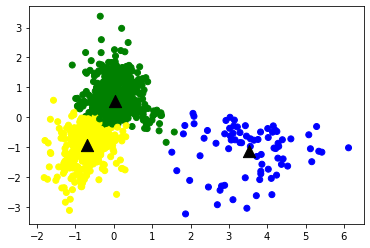

In [24]:
kmeans_model = KMeans(n_clusters=3, init='k-means++', max_iter=100) 
X = kmeans_model.fit(d2v_model1.dv.vectors.astype('double'))
labels=kmeans_model.labels_.tolist()
l = kmeans_model.fit_predict(d2v_model1.dv.vectors.astype('double'))
pca = PCA(n_components=2).fit(d2v_model1.dv.vectors.astype('double'))
datapoint = pca.transform(d2v_model1.dv.vectors.astype('double'))
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure
label1 = ['#FFFF00', '#008000', '#0000FF', '#800080' ,'#87cf5f', '#c48e34', '#6df68d', '#25f4c4', '#42cb08', '#e131fd', '#3033ad']
color = [label1[i] for i in labels]
plt.scatter(datapoint[:, 0], datapoint[:, 1], c=color)
centroids = kmeans_model.cluster_centers_
centroidpoint = pca.transform(centroids)
plt.scatter(centroidpoint[:, 0], centroidpoint[:, 1], marker='^', s=150, c='#000000')
plt.show()

In [25]:
l

array([0, 0, 2, ..., 0, 2, 2])

In [26]:
kmeans_model.predict([Targets.astype('double')])

array([0])

In [282]:
Arr

array([-0.55415875,  0.18302965,  0.05301688,  0.01416197, -0.38728097,
       -0.20180136,  0.05015849,  0.33861589, -0.49948713, -0.30717781,
        0.07829355, -0.12914956,  0.12516071,  0.06419074,  0.40892729,
       -0.15569149, -0.00415612,  0.46292043, -0.25305653, -0.41531786,
       -0.23779216, -0.05907848,  0.24723797, -0.24728674, -0.26297811,
       -0.04280188,  0.2787579 , -0.33684576,  0.10462189, -0.07020874,
       -0.13403539,  0.09064054,  0.10463381,  0.27208945, -0.08326949,
       -0.10067216,  0.00351356, -0.1788379 , -0.27893874,  0.05604256,
        0.0080186 ,  0.0648631 ,  0.26816386,  0.4197107 ,  0.39734721,
        0.12793411, -0.11827081,  0.18274076,  0.0135488 , -0.13298589,
       -0.34272844, -0.04526481,  0.15677038, -0.11853819, -0.08154242,
       -0.21346176,  0.06221566, -0.26379603,  0.46668643,  0.11791011,
        0.14417443, -0.17808205,  0.3221662 , -0.25888664, -0.1095102 ,
        0.13044626,  0.36152336,  0.17043406, -0.13716862,  0.03

In [279]:
kmeans_model.predict([np.double(d2v_model.dv.vectors[-1])])

ValueError: Buffer dtype mismatch, expected 'double' but got 'float'

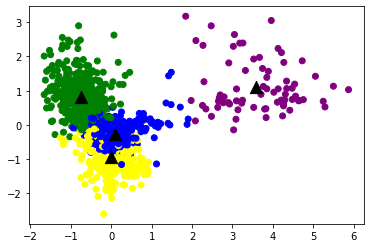

In [270]:
kmeans_model = KMeans(n_clusters=4, init='k-means++', max_iter=100) 
X = kmeans_model.fit(d2v_model.dv.vectors)
labels=kmeans_model.labels_.tolist()
l = kmeans_model.fit_predict(d2v_model.dv.vectors)
pca = PCA(n_components=2).fit(d2v_model.dv.vectors)
datapoint = pca.transform(d2v_model.dv.vectors)
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure
label1 = ['#FFFF00', '#008000', '#0000FF', '#800080' ,'#87cf5f', '#c48e34', '#6df68d', '#25f4c4', '#42cb08', '#e131fd', '#3033ad']
color = [label1[i] for i in labels]
plt.scatter(datapoint[:, 0], datapoint[:, 1], c=color)
centroids = kmeans_model.cluster_centers_
centroidpoint = pca.transform(centroids)
plt.scatter(centroidpoint[:, 0], centroidpoint[:, 1], marker='^', s=150, c='#000000')
plt.show()

In [274]:
labels

[2,
 0,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 2,
 0,
 2,
 0,
 1,
 0,
 2,
 1,
 2,
 3,
 0,
 1,
 0,
 1,
 2,
 2,
 0,
 0,
 2,
 2,
 0,
 0,
 2,
 0,
 3,
 1,
 1,
 1,
 3,
 0,
 1,
 0,
 1,
 2,
 1,
 2,
 3,
 0,
 1,
 1,
 0,
 0,
 1,
 3,
 3,
 2,
 1,
 2,
 3,
 2,
 1,
 1,
 2,
 1,
 0,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 0,
 1,
 0,
 0,
 2,
 2,
 1,
 1,
 1,
 1,
 2,
 1,
 1,
 1,
 1,
 0,
 2,
 1,
 3,
 0,
 0,
 0,
 0,
 1,
 1,
 0,
 1,
 0,
 1,
 2,
 2,
 2,
 1,
 0,
 0,
 3,
 1,
 2,
 2,
 0,
 2,
 2,
 1,
 0,
 2,
 2,
 2,
 2,
 2,
 0,
 2,
 2,
 0,
 1,
 2,
 2,
 2,
 1,
 3,
 2,
 1,
 0,
 2,
 2,
 0,
 2,
 1,
 2,
 1,
 1,
 2,
 1,
 3,
 1,
 2,
 0,
 2,
 1,
 3,
 1,
 2,
 0,
 1,
 0,
 0,
 0,
 0,
 2,
 2,
 3,
 2,
 2,
 2,
 1,
 2,
 2,
 2,
 0,
 2,
 0,
 2,
 2,
 2,
 0,
 1,
 2,
 1,
 1,
 2,
 2,
 0,
 0,
 1,
 2,
 1,
 3,
 1,
 0,
 2,
 2,
 0,
 1,
 2,
 1,
 2,
 0,
 2,
 1,
 1,
 1,
 1,
 2,
 2,
 2,
 2,
 1,
 2,
 2,
 2,
 0,
 0,
 0,
 2,
 0,
 2,
 2,
 2,
 1,
 3,
 2,
 1,
 2,
 1,
 1,
 0,
 2,
 1,
 0,
 2,
 2,
 2,
 1,
 2,
 1,
 0,
 2,
 2,
 0,
 0,
 2,
 1,
 1,
 2,
 2,
 0,
 2,
 0,


In [273]:
kmeans_model.fit_predict([d2v_model.dv.vectors[0], d2v_model.dv.vectors[0], d2v_model.dv.vectors[0], d2v_model.dv.vectors[0]])

C:\Users\slubo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning:

KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=1.

C:\Users\slubo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:996: ConvergenceWarning:

Number of distinct clusters (1) found smaller than n_clusters (4). Possibly due to duplicate points in X.



array([0, 0, 0, 0])

In [196]:
labels

[3,
 0,
 3,
 3,
 3,
 1,
 3,
 3,
 3,
 3,
 1,
 1,
 1,
 0,
 3,
 0,
 3,
 3,
 1,
 2,
 1,
 3,
 0,
 3,
 1,
 1,
 0,
 0,
 1,
 0,
 0,
 0,
 1,
 3,
 2,
 3,
 3,
 0,
 2,
 0,
 3,
 0,
 3,
 1,
 3,
 1,
 2,
 0,
 3,
 3,
 0,
 3,
 3,
 2,
 2,
 1,
 3,
 1,
 2,
 1,
 3,
 3,
 0,
 3,
 1,
 3,
 0,
 0,
 0,
 3,
 0,
 3,
 3,
 0,
 3,
 0,
 0,
 1,
 0,
 3,
 1,
 3,
 3,
 1,
 3,
 3,
 3,
 3,
 0,
 3,
 3,
 2,
 0,
 0,
 0,
 0,
 3,
 3,
 0,
 3,
 0,
 3,
 1,
 1,
 1,
 0,
 0,
 0,
 2,
 3,
 0,
 1,
 0,
 1,
 1,
 3,
 0,
 1,
 1,
 0,
 1,
 1,
 1,
 1,
 1,
 0,
 3,
 1,
 3,
 1,
 3,
 2,
 1,
 3,
 0,
 1,
 1,
 0,
 1,
 3,
 1,
 3,
 3,
 0,
 0,
 2,
 3,
 1,
 0,
 1,
 3,
 2,
 3,
 1,
 0,
 3,
 0,
 0,
 0,
 0,
 1,
 1,
 2,
 3,
 1,
 1,
 3,
 1,
 1,
 1,
 0,
 1,
 0,
 1,
 1,
 1,
 0,
 3,
 1,
 3,
 3,
 1,
 1,
 0,
 0,
 3,
 0,
 3,
 2,
 3,
 0,
 1,
 1,
 1,
 3,
 1,
 3,
 1,
 0,
 1,
 0,
 3,
 3,
 0,
 1,
 1,
 1,
 1,
 3,
 1,
 1,
 1,
 0,
 0,
 0,
 1,
 0,
 1,
 1,
 1,
 3,
 2,
 0,
 3,
 1,
 3,
 3,
 0,
 1,
 3,
 0,
 3,
 1,
 1,
 3,
 0,
 3,
 0,
 1,
 1,
 0,
 0,
 1,
 3,
 3,
 1,
 1,
 0,
 1,
 0,


In [159]:
len(d2v_model.dv.vectors)

7941

In [160]:
datapoint

array([[ 2.0362167 ,  0.9167323 ],
       [ 0.12529382,  0.9929702 ],
       [ 0.11210035,  1.9454911 ],
       ...,
       [-0.14416286,  0.3790749 ],
       [ 0.03505628, -0.3141718 ],
       [-1.4358823 , -0.5844422 ]], dtype=float32)

In [190]:
df_train_last

,all_texts,number_profession,cluster_number_kmean,cluster_number_tfidf
0,название вакансия : machine learning engineer ...,1,1,3
1,название вакансия : разработчик machine learni...,1,3,16
2,название вакансия : machine learning engineer ...,1,21,16
3,название вакансия : machine learning and compu...,1,21,16
4,название вакансия : data scientist / machine l...,1,11,15
...,...,...,...,...
7936,название вакансия : тимлид группа бэкенд разра...,8,16,13
7937,название вакансия : программис / back - end ph...,8,34,36
7938,название вакансия : full stack ( frond - end /...,8,34,2
7939,название вакансия : бэк энд разработчик . зарп...,8,15,36


In [191]:
from sklearn.model_selection import train_test_split

In [ ]:
LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train_data_science = []
j=0
for em in df_data_science['complete_text'].values:
    all_content_train_data_science.append(LabeledSentence1(em,[j]))
    j+=1
print('Number of texts processed: ', j)

In [143]:
import plotly.express as px
df = px.data.iris()
fig = px.scatter_3d(df_x2, x='first_number', y='second_number', z='third_number',
                    color='labels_kmean')
fig.show()

# Data Science

In [224]:
LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train_data_science = []
j=0
for em in df_data_science['complete_text'].values:
    all_content_train_data_science.append(LabeledSentence1(em,[j]))
    j+=1
print('Number of texts processed: ', j)

Number of texts processed:  575


In [659]:
all_content_train_data_science

[TaggedDocument(words='название вакансия : machine learning engineer ( ml , infrastructure ) . зарплата : от 3 000 eur на рука . название компания greenscreens . ai . требуемый опыт требуемый опыт работа : 3–6 год . занятость полный занятость , удалённый работа . описание вакансия greenscreens.ai is saas platform offering ml and data science - based freight price predictions for the us logistics market . we are a fast growing company and we recently raised a round of investment a. part of engineering team work from an office in vilnius , part remotely from russia . headquarter , sales , analytics and support in the us https://greenscreens.ai/ we are looking for a ml engineer to grow and develop both ml engine and infrastructure parts of our system responsibilities scale existing models and optimize performance ( rps , memory consumption ) work to automate ai / ml pipelines and cover end - to - end model ’s lifecycle build an infrastructure for training models and managing experime

In [230]:
from gensim.test.utils import get_tmpfile
d2v_model_data_science = Doc2Vec(all_content_train_data_science, vector_size = 100, window = 10, min_count = 500, workers=7, dm = 1,alpha=0.025, min_alpha=0.001)
d2v_model_data_science.save('doc2vec_1.model')



In [657]:
d2v_model_data_science.dv.vectors[0]

array([ 0.04954812, -0.32530236, -0.26912764,  0.16855945, -0.43346772,
       -0.5674724 , -0.33625248, -0.1583109 , -0.14538626, -0.21332836,
        0.17755964, -0.03660279,  0.22329088,  0.18477881, -0.16285452,
       -0.76357067,  0.394497  , -0.15054627,  0.26847848, -0.31423944,
        0.5120122 ,  0.5853594 , -0.28981242, -0.2601059 ,  0.29317206,
       -0.15232006, -0.67525846, -0.12471883,  0.35404873, -0.31516707,
        0.62501186,  0.64912796,  0.13963363, -0.9637123 ,  0.21120106,
        0.13044834,  0.04134473, -0.6096159 , -0.73858166,  0.01378936,
       -0.6578219 , -0.0799556 ,  0.7108607 , -0.52464586,  0.0324133 ,
       -0.60337645, -0.612935  , -0.08344591,  0.44164652, -0.4876053 ,
        0.48651665,  0.5302389 , -0.01469033, -0.12589993,  0.5361463 ,
        0.67580813,  0.45443624,  0.39519545, -0.09711568,  0.4740971 ,
       -0.02389295,  0.08846683, -0.29438928,  0.45780563,  0.14109693,
       -0.20369893, -0.4652254 , -0.11371849,  0.40186542, -0.06

In [238]:
import pickle as pk

In [351]:
kmeans_model = KMeans(n_clusters=3, init='k-means++', max_iter=100) 
X = kmeans_model.fit(d2v_model_data_science.dv.vectors.astype('double'))
labels=kmeans_model.labels_.tolist()
l = kmeans_model.fit_predict(d2v_model_data_science.dv.vectors.astype('double'))
pca = PCA(n_components=2).fit(d2v_model_data_science.dv.vectors.astype('double'))
datapoint = pca.transform(d2v_model_data_science.dv.vectors.astype('double'))
df_data_science['kmeans_labels'] = labels

C:\Users\slubo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(
C:\Users\slubo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=3.
  warnings.warn(


In [352]:
df_data_science

,Unnamed: 0,name_vacancy,salary,name_company,location_company,location_company_link,required_experience,busyness,description,key_skills,vacancy_url,all_feature_text,complete_text,kmeans_labels
0,0,"Machine Learning Engineer (ML, Infrastructure)",от 3 000 EUR на руки,Greenscreens.AI,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, удаленная работа",Greenscreens.ai is SaaS platform offering ML a...,Английский — B1 — Средний ML Gitlab CI AWS Mac...,https://hh.ru/vacancy/53209019?from=vacancy_se...,Название вакансии: Machine Learning Engineer (...,название вакансия : machine learning engineer ...,1
1,1,Разработчик Machine Learning,от 200 000 до 250 000 руб. на руки,"Megaputer Intelligence, Компания","Москва, Бауманская улица, 6с2",https://hh.ru/search/vacancy/map?vacancy_id=51...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день","Международная компания Megaputer Intelligence,...",Python Mathematical Programming Machine Learnin,https://hh.ru/vacancy/51187368?from=vacancy_se...,Название вакансии: Разработчик Machine Learnin...,название вакансия : разработчик machine learni...,2
2,2,Machine Learning Engineer,з/п не указана,ООО GlowByte,Москва,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, гибкий график",GlowByte - лидер в сфере разработки Business I...,Python Git SQL Docker ОО,https://hh.ru/vacancy/54604003?from=vacancy_se...,Название вакансии: Machine Learning Engineer. ...,название вакансия : machine learning engineer ...,2
3,3,Machine Learning and Computer vision developer,з/п не указана,ООО ЭДС,Москва,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Мы - современная компания, занимающаяся разраб...",Python Linux SQL PyTorch OpenCV Keras Caffe Te...,https://hh.ru/vacancy/54286707?from=vacancy_se...,Название вакансии: Machine Learning and Comput...,название вакансия : machine learning and compu...,2
4,4,Data Scientist / Machine Learning Engineer,до 100 000 руб. до вычета налогов,ГБУЗ «Научно-практический клинический центр ди...,"Москва, улица Петровка, 24",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",НПКЦ диагностики и телемедицины («Радиология М...,Медицинское оборудование Написание научный ста...,https://hh.ru/vacancy/54563781?from=vacancy_se...,Название вакансии: Data Scientist / Machine Le...,название вакансия : data scientist / machine l...,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
570,570,Системный аналитик в команду Compliance Data E...,з/п не указана,Райффайзен Банк,Санкт-Петербург,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, гибкий график",Организовывать процессы интеграции данных из р...,SQL Аналитическое мышление UML PostgreSQL Анал...,https://hh.ru/vacancy/53894164?from=vacancy_se...,Название вакансии: Системный аналитик в команд...,название вакансия : системный аналитик в кома...,2
571,571,Системный аналитик (проект Data Tools),от 120 000 до 200 000 руб. до вычета налогов,SberTech,Новосибирск,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Сбер сегодня - это, крупнейшая цифровая экосис...",-,https://hh.ru/vacancy/53980649?from=vacancy_se...,Название вакансии: Системный аналитик (проект ...,название вакансия : системный аналитик ( прое...,0
572,572,Старший системный аналитик (Big Data),з/п не указана,"ПАО «МТС», IT",Псков,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Поддержка существующих регламентных ETL процес...,Linux SQL ETL Bas,https://hh.ru/vacancy/54770336?from=vacancy_se...,Название вакансии: Старший системный аналитик ...,название вакансия : старший системный аналит...,2
573,573,Клиентский аналитик/ Senior data scientist,з/п не указана,ПАО Совкомбанк,"Суконная слобода, Казань, Петербургская улица,...",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Построение автоматических ботов-консультантов ...,Python SQL Анализ данных Статистический анализ...,https:

In [ ]:
pk.dump(kmeans_model, open("model_main_1.pkl","wb"))
pk.dump(pca, open('model_pca_1.pkl', 'wb'))

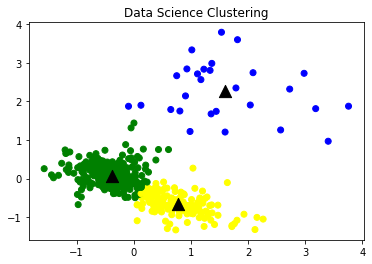

In [241]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure
plt.title('Data Science Clustering')
label1 = ['#FFFF00', '#008000', '#0000FF', '#800080' ,'#87cf5f', '#c48e34', '#6df68d', '#25f4c4', '#42cb08', '#e131fd', '#3033ad']
color = [label1[i] for i in labels]
plt.scatter(datapoint[:, 0], datapoint[:, 1], c=color)
centroids = kmeans_model.cluster_centers_
centroidpoint = pca.transform(centroids)
plt.scatter(centroidpoint[:, 0], centroidpoint[:, 1], marker='^', s=150, c='#000000')
plt.show()

In [60]:
kmeans_model.predict([targets.astype('double')])

array([1])

In [55]:
sents =  df_data_science['complete_text'][0].split()
targets = d2v_model.infer_vector(sents)

# Data Engineer

In [242]:
LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train_data_engineer = []
j=0
for em in df_data_engineer['complete_text'].values:
    all_content_train_data_engineer.append(LabeledSentence1(em,[j]))
    j+=1
print('Number of texts processed: ', j)

Number of texts processed:  335


In [254]:
d2v_model_data_engineer = Doc2Vec(all_content_train_data_engineer, vector_size = 100, window = 10, min_count = 500, workers=7, dm = 1,alpha=0.025, min_alpha=0.001)
d2v_model_data_engineer.save('doc2vec_2.model')

In [354]:
kmeans_model = KMeans(n_clusters=3, init='k-means++', max_iter=100) 
X = kmeans_model.fit(d2v_model_data_engineer.dv.vectors.astype('double'))
labels=kmeans_model.labels_.tolist()
l = kmeans_model.fit_predict(d2v_model_data_engineer.dv.vectors.astype('double'))
pca = PCA(n_components=2).fit(d2v_model_data_engineer.dv.vectors.astype('double'))
datapoint = pca.transform(d2v_model_data_engineer.dv.vectors.astype('double'))
df_data_engineer['kmeans_labels'] = labels


C:\Users\slubo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\slubo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [356]:
df_data_engineer

,Unnamed: 0,name_vacancy,salary,name_company,location_company,location_company_link,required_experience,busyness,description,key_skills,vacancy_url,all_feature_text,complete_text,kmeans_labels
0,0,Data Quality Engineer / Data Analyst,з/п не указана,"X5 RETAIL GROUP, Tech",Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, удаленная работа",Анабар — система аналитики и автоматизации про...,SQL Pytho,https://hh.ru/vacancy/55231847?from=vacancy_se...,Название вакансии: Data Quality Engineer / Dat...,название вакансия : data quality engineer / da...,0
1,1,Data Engineer,з/п не указана,Тинькофф,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, удаленная работа",Писать запросы к базам данных. Программировать...,Python SQL Java ООП Pandas DWH Базы данных ET,https://hh.ru/vacancy/55212183?from=vacancy_se...,Название вакансии: Data Engineer. Зарплата: з/...,название вакансия : data engineer . зарплата :...,0
2,2,Business Data Engineer,з/п не указана,Тинькофф,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, удаленная работа",You will be involved in preparation Management...,SQL Hadoop Работа с базами данных ETL Базы дан...,https://hh.ru/vacancy/49971464?from=vacancy_se...,Название вакансии: Business Data Engineer. Зар...,название вакансия : business data engineer . з...,0
3,3,Data engineer/ Инженер по данным (удаленно),з/п не указана,билайн: ИТ и Digital,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, удаленная работа",Писать запросы к базам данных. Программировать...,SQL ETL Spark SCALA Kafka ORACLE Hadoop NiFi F...,https://hh.ru/vacancy/55218492?from=vacancy_se...,Название вакансии: Data engineer/ Инженер по д...,название вакансия : data engineer/ инженер по ...,0
4,4,Data Engineer,з/п не указана,Devim,Санкт-Петербург,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Привет! На связи Devim. Для начала – немного о...,Python SQL Анализ данных PostgreSQL ClickHouse...,https://hh.ru/vacancy/55155821?from=vacancy_se...,Название вакансии: Data Engineer. Зарплата: з/...,название вакансия : data engineer . зарплата :...,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
330,330,Системный инженер (Big Data),з/п не указана,Rubytech,"Алексеевская, ВДНХ, Улица Академика Королёва, ...",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Rubytech — российская ИТ-компания, которая пом...",Управление проектами Linux Информационные техн...,https://hh.ru/vacancy/54724710?from=vacancy_se...,Название вакансии: Системный инженер (Big Data...,название вакансия : системный инженер ( big d...,2
331,331,"Заместитель начальника отдела, Внутреннее казн...",з/п не указана,АО Россельхозбанк,"Международная, Москва, Пресненская набережная,...",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Обязанности: Участие от команды Казначейства ...,SQL Python Oracle Pl/SQL Java ET,https://hh.ru/vacancy/54788607?from=vacancy_se...,Название вакансии: Заместитель начальника отде...,название вакансия : заместитель начальник отде...,0
332,332,DevOps engineer (Big Data),з/п не указана,"ПАО «МТС», IT","Технопарк, Москва, проспект Андропова, 18к9",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Участие в развитии ML платформы T2 AI Platform...,Python Linux Git Docker PostgreSQL Prometheus ...,https://hh.ru/vacancy/54715097?from=vacancy_se...,Название вакансии: DevOps engineer (Big Data)....,название вакансия : devops engineer ( big data...,0
333,333,Старший инженер поддержки (Data),з/п не указана,Tele2,Ростов-на-Дону,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Участие в разработке ядра продуктов Data Platf...,Системное мышление Критическое мышление SQL Te...,https://hh.ru/vacancy/53867491?from=vacancy_se...,Название вакансии: Старший инженер поддержки (...,название вакансия : старший инженер подд

In [ ]:
pk.dump(kmeans_model, open("model_main_2.pkl","wb"))
pk.dump(pca, open('model_pca_2.pkl', 'wb'))

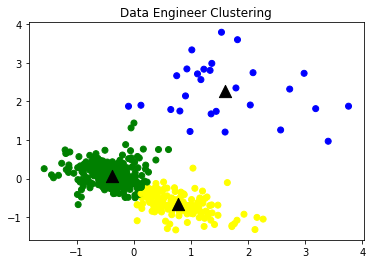

In [245]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure
plt.title('Data Engineer Clustering')
label1 = ['#FFFF00', '#008000', '#0000FF', '#800080' ,'#87cf5f', '#c48e34', '#6df68d', '#25f4c4', '#42cb08', '#e131fd', '#3033ad']
color = [label1[i] for i in labels]
plt.scatter(datapoint[:, 0], datapoint[:, 1], c=color)
centroids = kmeans_model.cluster_centers_
centroidpoint = pca.transform(centroids)
plt.scatter(centroidpoint[:, 0], centroidpoint[:, 1], marker='^', s=150, c='#000000')
plt.show()

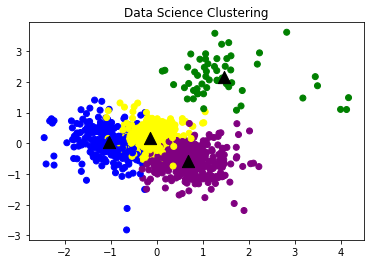

In [117]:
sents =  df_data_engineer['complete_text'][0].split()
targets = d2v_model_data_engineer.infer_vector(sents)

In [118]:
kmeans_model.predict([targets.astype('double')])

array([1])

# Product Manager

In [247]:
LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train_product_manager = []
j=0
for em in df_product_manager['complete_text'].values:
    all_content_train_product_manager.append(LabeledSentence1(em,[j]))
    j+=1
print('Number of texts processed: ', j)

Number of texts processed:  1146


In [251]:
d2v_model_product_manager = Doc2Vec(all_content_train_product_manager, vector_size = 100, window = 10, min_count = 500, workers=7, dm = 1,alpha=0.025, min_alpha=0.001)
d2v_model_product_manager.save('doc2vec_3.model')

In [357]:
kmeans_model = KMeans(n_clusters=4, init='k-means++', max_iter=100) 
X = kmeans_model.fit(d2v_model_product_manager.dv.vectors.astype('double'))
labels=kmeans_model.labels_.tolist()
l = kmeans_model.fit_predict(d2v_model_product_manager.dv.vectors.astype('double'))
pca = PCA(n_components=2).fit(d2v_model_product_manager.dv.vectors.astype('double'))
datapoint = pca.transform(d2v_model_product_manager.dv.vectors.astype('double'))
df_product_manager['kmeans_labels'] = labels


In [358]:
df_product_manager

,Unnamed: 0,name_vacancy,salary,name_company,location_company,location_company_link,required_experience,busyness,description,key_skills,vacancy_url,all_feature_text,complete_text,kmeans_labels
0,0,Продакт-менеджер,от 10 000 000 до 15 000 000 сум на руки,OOO NATURAL JUICE,"Ташкент, 3-й проезд Ниезбек Йули, 4",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Мы предлагаем: Пятидневная рабочая неделя Раб...,Русский — C2 — В совершенстве Маркетинговый ан...,https://hh.ru/vacancy/55226325?from=vacancy_se...,Название вакансии: Продакт-менеджер. Зарплата:...,название вакансия : продакт - менеджер . зарпл...,1
1,1,Product Manager (размещение заказов на произво...,от 200 000 руб. на руки,ООО ЖэТэ-Транс Лимитед,"Красносельская, Москва, Спартаковский переулок...",https://hh.ru/search/vacancy/map?vacancy_id=48...,Требуемый опыт работы: более 6 лет,"Полная занятость, полный день",Для иностранного бренда молодежной марки одежд...,-,https://hh.ru/vacancy/48954023?from=vacancy_se...,Название вакансии: Product Manager (размещение...,название вакансия : product manager ( размещен...,1
2,2,Product Manager в международный проект,от 220 000 до 250 000 руб. на руки,Мирафокс,Москва,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, удаленная работа",Компания Mirafox приглашает в команду талантли...,-,https://hh.ru/vacancy/55185964?from=vacancy_se...,Название вакансии: Product Manager в междунаро...,название вакансия : product manager в междунар...,1
3,3,Менеджер продукта,з/п не указана,ООО СЕУСЛАБ,"Пермь, шоссе Космонавтов, 111к3",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Обязанности: Отвечает за создание и эксплуата...,Постановка задач разработчикам Agile Project M...,https://hh.ru/vacancy/55196606?from=vacancy_se...,Название вакансии: Менеджер продукта. Зарплата...,название вакансия : менеджер продукт . зарплат...,1
4,4,Product manager,з/п не указана,Jivo,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, удаленная работа",Кто мы?Jivo - международная продуктовая компан...,Product Management Управление проектами Разраб...,https://hh.ru/vacancy/55191153?from=vacancy_se...,Название вакансии: Product manager. Зарплата: ...,название вакансия : product manager . зарплата...,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1141,1141,Продакт-менеджер,от 1 500 EUR на руки,Иностр. п. Представительство ALPEN PHARMA AG в РБ,минск,https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Представительство европейской фармацевтической...,-,https://hh.ru/vacancy/54957032?from=vacancy_se...,Название вакансии: Продакт-менеджер. Зарплата:...,название вакансия : продакт - менеджер . зарпл...,1
1142,1142,Продакт менеджер APC,з/п не указана,ООО MUK International,Армения,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Требования: Высшее техническое образование; О...,Организация мероприятий Анализ ценообразования...,https://hh.ru/vacancy/54927815?from=vacancy_se...,Название вакансии: Продакт менеджер APC. Зарпл...,название вакансия : продакт менеджер apc . зар...,2
1143,1143,Продакт менеджер Juniper,з/п не указана,ТОО «Мук-Компьютерс»,Алматы,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Требования: Высшее техническое образование; З...,Английский — B1 — Средний Грамотная речь Прове...,https://hh.ru/vacancy/54923394?from=vacancy_se...,Название вакансии: Продакт менеджер Juniper. З...,название вакансия : продакт менеджер juniper ....,0
1144,1144,Brand executive (продакт менеджер),з/п не указана,Представительство компании ГЕТЕРО ЛАБС ЛИМИТЕД...,Бишкек,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Обязанности: Планирование и контроль маркетин...,Английский — B1 — Средний Организация мероприя...,https://hh.ru/vacancy/54683931?from=vacancy_se...,Название вакансии: Brand executive (продакт ме...,назван

In [ ]:
pk.dump(kmeans_model, open("model_main_3.pkl","wb"))
pk.dump(pca, open('model_pca_3.pkl', 'wb'))

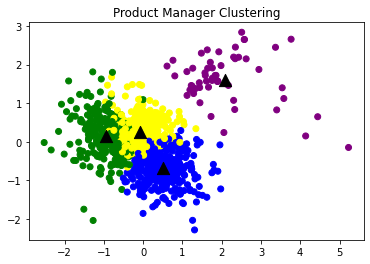

In [250]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure
plt.title('Product Manager Clustering')
label1 = ['#FFFF00', '#008000', '#0000FF', '#800080' ,'#87cf5f', '#c48e34', '#6df68d', '#25f4c4', '#42cb08', '#e131fd', '#3033ad']
color = [label1[i] for i in labels]
plt.scatter(datapoint[:, 0], datapoint[:, 1], c=color)
centroids = kmeans_model.cluster_centers_
centroidpoint = pca.transform(centroids)
plt.scatter(centroidpoint[:, 0], centroidpoint[:, 1], marker='^', s=150, c='#000000')
plt.show()

In [79]:
l

array([2, 2, 2, ..., 3, 3, 3])

In [119]:
sents =  df_product_manager['complete_text'][0].split()
targets = d2v_model_product_manager.infer_vector(sents)

In [120]:
kmeans_model.predict([targets.astype('double')])

array([1])

# SMM_Manager

In [255]:
LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train_smm_manager = []
j=0
for em in df_smm_manager['complete_text'].values:
    all_content_train_smm_manager.append(LabeledSentence1(em,[j]))
    j+=1
print('Number of texts processed: ', j)

Number of texts processed:  387


In [256]:
d2v_model_smm_manager = Doc2Vec(all_content_train_smm_manager, vector_size = 100, window = 10, min_count = 500, workers=7, dm = 1,alpha=0.025, min_alpha=0.001)
d2v_model_smm_manager.save('doc2vec_4.model')

In [359]:
kmeans_model = KMeans(n_clusters=3, init='k-means++', max_iter=100) 
X = kmeans_model.fit(d2v_model_smm_manager.dv.vectors.astype('double'))
labels=kmeans_model.labels_.tolist()
l = kmeans_model.fit_predict(d2v_model_smm_manager.dv.vectors.astype('double'))
pca = PCA(n_components=2).fit(d2v_model_smm_manager.dv.vectors.astype('double'))
datapoint = pca.transform(d2v_model_smm_manager.dv.vectors.astype('double'))
df_smm_manager['kmeans_labels'] = labels


C:\Users\slubo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(
C:\Users\slubo\anaconda3\lib\site-packages\sklearn\cluster\_kmeans.py:1332: UserWarning: KMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can avoid it by setting the environment variable OMP_NUM_THREADS=2.
  warnings.warn(


In [360]:
df_smm_manager

,Unnamed: 0,name_vacancy,salary,name_company,location_company,location_company_link,required_experience,busyness,description,key_skills,vacancy_url,all_feature_text,complete_text,kmeans_labels
0,0,SMM - менеджер в Instagram,от 150 000 до 300 000 KZT на руки,ТОО SМMPro,Алматы,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Вы креативный и ответственный человек и у Вас ...,Русский — C2 — В совершенстве Казахский — A2 —...,https://hh.ru/vacancy/55170763?from=vacancy_se...,Название вакансии: SMM - менеджер в Instagram....,название вакансия : smm - менеджер в instagram...,2
1,1,"SMM-менеджер в проект ""Топим жир""",от 350 000 до 500 000 KZT на руки,ТОО The flow,"Алматы, проспект Достык, 117/6",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Проект ""Топим жир"" один из флагманских продукт...",Креативность Копирайтинг Организаторские навык...,https://hh.ru/vacancy/55226094?from=vacancy_se...,"Название вакансии: SMM-менеджер в проект ""Топи...","название вакансия : smm - менеджер в проект "" ...",2
2,2,Мобилограф / сторисмейкер / SMM менеджер,от 180 000 до 180 000 KZT на руки,ИП Мега арт-двери (ИП «Пон В.В.»),"Шымкент, улица Акпан батыра, 111",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Администрирование и продвижение Instagram - ак...,Грамотная речь Пользователь ПК Грамотность Обр...,https://hh.ru/vacancy/55222964?from=vacancy_se...,Название вакансии: Мобилограф / сторисмейкер /...,название вакансия : мобилограф / сторисмейкер...,0
3,3,SMM-менеджер,от 150 000 до 350 000 KZT на руки,ТОО COMbination,Алматы,https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день","Привет! Мы рекламное агентство, в котором осно...",Продвижение в социальных группах SMM Ведение г...,https://hh.ru/vacancy/55141268?from=vacancy_se...,Название вакансии: SMM-менеджер. Зарплата: от ...,название вакансия : smm - менеджер . зарплата ...,1
4,4,Social Media Marketing (SMM) Manager,от 1 500 EUR до вычета налогов,Slash,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, удаленная работа",Slash.com is looking for a proactive and creat...,Английский — C2 — В совершенстве Social Media ...,https://hh.ru/vacancy/55154559?from=vacancy_se...,Название вакансии: Social Media Marketing (SMM...,название вакансия : social media marketing ( s...,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
382,382,SMM-менеджер в магазин электроники,от 3 000 000 сум на руки,ООО A BRANDS SAVDO,Ташкент,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Обязанности: - Анализ рынка и конкурентов; - Р...,Узбекский — C1 — Продвинутый Русский — C2 — В ...,https://hh.ru/vacancy/54750812?from=vacancy_se...,Название вакансии: SMM-менеджер в магазин элек...,название вакансия : smm - менеджер в магазин э...,2
383,383,SMM/контент менеджер/менеджер по продажам,от 80 000 до 200 000 KZT на руки,ТОО IKKERT,"Сайран, Алматы, улица Толе Би, 280",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: не требуется,"Полная занятость, полный день",Мы крупная компания «Parfum.kz» более 15 лет я...,Английский — A1 — Начальный Торговля SMM Актив...,https://hh.ru/vacancy/55051056?from=vacancy_se...,Название вакансии: SMM/контент менеджер/менедж...,название вакансия : smm / контент менеджер / м...,2
384,384,Менеджер по работе с клиентами / интернет марк...,от 60 000 до 200 000 KZT до вычета налогов,ИП Nursadi,Алматы,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, удаленная работа",В компанию SADI.KZ интернет портал в строитель...,Деловая коммуникация Ведение переговоров Делов...,https://hh.ru/vacancy/54862856?from=vacancy_se...,Название вакансии: Менеджер по работе с клиент...,название вакансия : менеджер по работа с клиен...,0
385,385,Специалист по работе с клиентами/SMM-менеджер,з/п не указана,ООО Сталкер-Медиа,Минск,NaN,Требуемый опыт работы: 1–

In [ ]:
pk.dump(kmeans_model, open("model_main_4.pkl","wb"))
pk.dump(pca, open('model_pca_4.pkl', 'wb'))

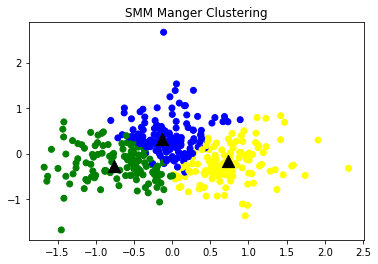

In [258]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure
plt.title('SMM Manger Clustering')
label1 = ['#FFFF00', '#008000', '#0000FF', '#800080' ,'#87cf5f', '#c48e34', '#6df68d', '#25f4c4', '#42cb08', '#e131fd', '#3033ad']
color = [label1[i] for i in labels]
plt.scatter(datapoint[:, 0], datapoint[:, 1], c=color)
centroids = kmeans_model.cluster_centers_
centroidpoint = pca.transform(centroids)
plt.scatter(centroidpoint[:, 0], centroidpoint[:, 1], marker='^', s=150, c='#000000')
plt.show()

In [121]:
sents =  df_smm_manager['complete_text'][0].split()
targets = d2v_model_smm_manager.infer_vector(sents)

In [122]:
kmeans_model.predict([targets.astype('double')])

array([1])

# Marketing Manager

In [259]:
LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train_marketing_manager = []
j=0
for em in df_marketing_manager['complete_text'].values:
    all_content_train_marketing_manager.append(LabeledSentence1(em,[j]))
    j+=1
print('Number of texts processed: ', j)

Number of texts processed:  1052


In [260]:
d2v_model_marketing_manager = Doc2Vec(all_content_train_marketing_manager, vector_size = 100, window = 10, min_count = 500, workers=7, dm = 1,alpha=0.025, min_alpha=0.001)
d2v_model_marketing_manager.save('doc2vec_5.model')

In [361]:
kmeans_model = KMeans(n_clusters=4, init='k-means++', max_iter=100) 
X = kmeans_model.fit(d2v_model_marketing_manager.dv.vectors.astype('double'))
labels=kmeans_model.labels_.tolist()
l = kmeans_model.fit_predict(d2v_model_marketing_manager.dv.vectors.astype('double'))
pca = PCA(n_components=2).fit(d2v_model_marketing_manager.dv.vectors.astype('double'))
datapoint = pca.transform(d2v_model_marketing_manager.dv.vectors.astype('double'))
df_marketing_manager['kmeans_labels'] = labels


In [362]:
df_marketing_manager

,Unnamed: 0,name_vacancy,salary,name_company,location_company,location_company_link,required_experience,busyness,description,key_skills,vacancy_url,all_feature_text,complete_text,kmeans_labels
0,0,Маркетолог,от 500 000 KZT на руки,ТОО Harmonia,Алматы,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Обязанности: Изучение рынка и рыночных тенд...,ATL BTL Маркетинговые исследования Маркетингов...,https://hh.ru/vacancy/55235310?from=vacancy_se...,Название вакансии: Маркетолог. Зарплата: от 50...,название вакансия : маркетолог . зарплата : от...,3
1,1,Маркетолог/Автоворонщик в онлайн-школу,от 50 000 руб. до вычета налогов,Евразийская Академия Предпринимательства,Москва,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, удаленная работа",В онлайн-школу Евразийская Академия Предприним...,Работа в команде Грамотность Поиск информации ...,https://hh.ru/vacancy/55198346?from=vacancy_se...,Название вакансии: Маркетолог/Автоворонщик в о...,название вакансия : маркетолог / автоворонщик ...,0
2,2,Интернет-маркетолог (Chief Marketing Officer),от 150 000 до 300 000 руб. на руки,ООО ЛИАНО,"Москва, 2-я Хуторская улица, 38А",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день","Внимание, нужен специалист в офис, удаленный р...",Интернет-реклама Маркетинговый анализ E-Mail M...,https://hh.ru/vacancy/55231567?from=vacancy_se...,Название вакансии: Интернет-маркетолог (Chief ...,название вакансия : интернет - маркетолог ( ch...,2
3,3,Менеджер по маркетингу,от 300 000 до 585 000 KZT на руки,ТОО DALEX DEVELOPMENT,"Райымбек батыра, Алматы, улица Грибоедова, 66",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Обязанности: Управляет процессами лидогенерац...,Создание лендингов Лендинг Коммуникация PR-кон...,https://hh.ru/vacancy/54509048?from=vacancy_se...,Название вакансии: Менеджер по маркетингу. Зар...,название вакансия : менеджер по маркетинг . за...,3
4,4,Marketing account manager,от 2 000 до 3 000 USD на руки,Coin Liquidity Solutions,Москва,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Coin Liquidity Solutions is a fintech company ...,Английский — C1 — Продвинутый Английский язык ...,https://hh.ru/vacancy/54801853?from=vacancy_se...,Название вакансии: Marketing account manager. ...,название вакансия : marketing account manager ...,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047,1047,Менеджер по маркетингу,з/п не указана,FitnesShock,"Тольятти, Транспортная улица, 26с3",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Комплексное развитие сайта Компании и его прод...,Локальные бренды Деловая переписка Документооб...,https://hh.ru/vacancy/54746662?from=vacancy_se...,Название вакансии: Менеджер по маркетингу. Зар...,название вакансия : менеджер по маркетинг . за...,2
1048,1048,Маркетолог/Seo-специалист,от 50 000 до 80 000 руб. на руки,WEBzavod.bz,"Санкт-Петербург, Чкаловская",NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Работаешь, развиваешься в маркетинге ? «WEBz...",Интернет-реклама Контекстная реклама Adobe Pho...,https://hh.ru/vacancy/55167336?from=vacancy_se...,Название вакансии: Маркетолог/Seo-специалист. ...,название вакансия : маркетолог / seo - специал...,0
1049,1049,Менеджер по маркетингу,з/п не указана,FitnesShock,"Тольятти, Транспортная улица, 26с3",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Комплексное развитие сайта Компании и его прод...,Локальные бренды Деловая переписка Документооб...,https://hh.ru/vacancy/54746662?from=vacancy_se...,Название вакансии: Менеджер по маркетингу. Зар...,название вакансия : менеджер по маркетинг . за...,2
1050,1050,Специалист отдела маркетинга,от 30 000 руб. до вычета налогов,АО СПЕЦПРИБОР,"Тула, улица Болдина, 94",https://hh.ru/search/vacancy/map?vacancy_id=34...,

In [ ]:
pk.dump(kmeans_model, open("model_main_5.pkl","wb"))
pk.dump(pca, open('model_pca_5.pkl', 'wb'))

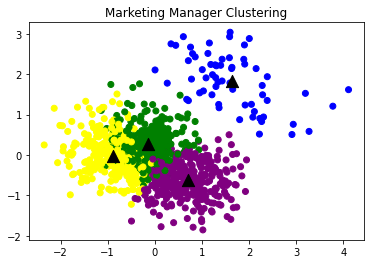

In [262]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure
plt.title('Marketing Manager Clustering')
label1 = ['#FFFF00', '#008000', '#0000FF', '#800080' ,'#87cf5f', '#c48e34', '#6df68d', '#25f4c4', '#42cb08', '#e131fd', '#3033ad']
color = [label1[i] for i in labels]
plt.scatter(datapoint[:, 0], datapoint[:, 1], c=color)
centroids = kmeans_model.cluster_centers_
centroidpoint = pca.transform(centroids)
plt.scatter(centroidpoint[:, 0], centroidpoint[:, 1], marker='^', s=150, c='#000000')
plt.show()

In [95]:
l

array([1, 2, 2, ..., 0, 1, 0])

In [123]:
sents =  df_marketing_manager['complete_text'][0].split()
targets = d2v_model_marketing_manager.infer_vector(sents)

In [124]:
kmeans_model.predict([targets.astype('double')])

array([1])

# Frontend Developer

In [263]:
LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train_frontend_developer = []
j=0
for em in df_frontend_developer['complete_text'].values:
    all_content_train_frontend_developer.append(LabeledSentence1(em,[j]))
    j+=1
print('Number of texts processed: ', j)

Number of texts processed:  1360


In [264]:
d2v_model_frontend_developer = Doc2Vec(all_content_train_frontend_developer, vector_size = 100, window = 10, min_count = 500, workers=7, dm = 1,alpha=0.025, min_alpha=0.001)
d2v_model_frontend_developer.save('doc2vec_6.model')

In [363]:
kmeans_model = KMeans(n_clusters=4, init='k-means++', max_iter=100) 
X = kmeans_model.fit(d2v_model_frontend_developer.dv.vectors.astype('double'))
labels=kmeans_model.labels_.tolist()
l = kmeans_model.fit_predict(d2v_model_frontend_developer.dv.vectors.astype('double'))
pca = PCA(n_components=2).fit(d2v_model_frontend_developer.dv.vectors.astype('double'))
datapoint = pca.transform(d2v_model_frontend_developer.dv.vectors.astype('double'))
df_frontend_developer['kmeans_labels'] = labels


In [364]:
df_frontend_developer

,Unnamed: 0,name_vacancy,salary,name_company,location_company,location_company_link,required_experience,busyness,description,key_skills,vacancy_url,all_feature_text,complete_text,kmeans_labels
0,0,Frontend-разработчик (+PixiJS),от 80 000 руб. на руки,Арбина,"Пенза, Московская улица, 62",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","О нас Мы - небольшая команда из Пензы, которая...",HTML5 CSS3 React Less Sass Redux JavaScript CS,https://hh.ru/vacancy/55169215?from=vacancy_se...,Название вакансии: Frontend-разработчик (+Pixi...,название вакансия : frontend - разработчик ( +...,2
1,1,Frontend-разработчик / HTML-верстальщик,з/п не указана,ООО Спортдата,"Восток, Минск, улица Петра Мстиславца, 9",https://hh.ru/search/vacancy/map?vacancy_id=50...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Минский офис международной компании, разрабаты...",HTML HTML5 CSS CSS3 JavaScript Reac,https://hh.ru/vacancy/50519573?from=vacancy_se...,Название вакансии: Frontend-разработчик / HTML...,название вакансия : frontend - разработчик / h...,2
2,2,Frontend-разработчик,от 1 200 до 1 800 USD на руки,ООО CAMBRIDGE GROUP,Ташкент,NaN,Требуемый опыт работы: более 6 лет,"Полная занятость, полный день",CAMBRIDGE Learning Centre - Это место где вы п...,Русский — C2 — В совершенстве Узбекский — C2 —...,https://hh.ru/vacancy/54974587?from=vacancy_se...,Название вакансии: Frontend-разработчик. Зарпл...,название вакансия : frontend - разработчик . з...,2
3,3,Frontend Game Developer (Кипр),з/п не указана,Невская Елизавета Сергеевна,город Лимасол,https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Наша молодая активная команда занимается разра...,-,https://hh.ru/vacancy/55091846?from=vacancy_se...,Название вакансии: Frontend Game Developer (Ки...,название вакансия : frontend game developer ( ...,2
4,4,Frontend-разработчик (React.js),з/п не указана,ООО Спортдата,"Восток, Минск, улица Петра Мстиславца, 9",https://hh.ru/search/vacancy/map?vacancy_id=50...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Минский офис международной компании, разрабаты...",-,https://hh.ru/vacancy/50519545?from=vacancy_se...,Название вакансии: Frontend-разработчик (React...,название вакансия : frontend - разработчик ( r...,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1355,1355,Frontend Developer (Angular),з/п не указана,ООО Перфект Арт,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Company Profile Perfect Art Group is the inter...,Английский — C1 — Продвинутый JavaScript HTML5...,https://hh.ru/vacancy/54794077?from=vacancy_se...,Название вакансии: Frontend Developer (Angular...,название вакансия : frontend developer ( angul...,0
1356,1356,Senior frontend-developer,з/п не указана,Сбер. IT,"Рязань, улица Семашко, 14",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Создание и развитие web-интерфейса собственной...,JavaScript HTML CSS Redux ReactJ,https://hh.ru/vacancy/54811266?from=vacancy_se...,Название вакансии: Senior frontend-developer. ...,название вакансия : senior frontend - develope...,3
1357,1357,Team Lead Frontend,з/п не указана,ООО СберОбразование,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день","СберОбразование — компания экосистемы Сбер, ос...",JavaScript TypeScript Обучение TeamLead Reac,https://hh.ru/vacancy/54951899?from=vacancy_se...,Название вакансии: Team Lead Frontend. Зарплат...,название вакансия : team lead frontend . зарпл...,1
1358,1358,Front-end разработчик,з/п не указана,Сбер для экспертов,Москва,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Участвовать во всех фазах разработки.2 года оп...,-,https://hh.ru/vacancy/54876928?from=vacancy_se...,Название вакансии: Front-end разработчик. Зарп...,название вакансия : front - end разработчик . ...,3


In [ ]:
pk.dump(kmeans_model, open("model_main_6.pkl","wb"))
pk.dump(pca, open('model_pca_6.pkl', 'wb'))

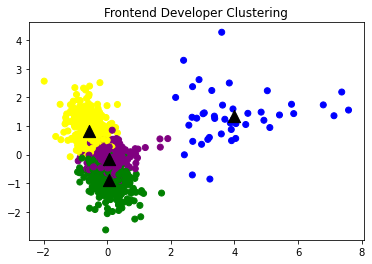

In [266]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure
plt.title('Frontend Developer Clustering')
label1 = ['#FFFF00', '#008000', '#0000FF', '#800080' ,'#87cf5f', '#c48e34', '#6df68d', '#25f4c4', '#42cb08', '#e131fd', '#3033ad']
color = [label1[i] for i in labels]
plt.scatter(datapoint[:, 0], datapoint[:, 1], c=color)
centroids = kmeans_model.cluster_centers_
centroidpoint = pca.transform(centroids)
plt.scatter(centroidpoint[:, 0], centroidpoint[:, 1], marker='^', s=150, c='#000000')
plt.show()

In [107]:
l

array([0, 0, 0, ..., 2, 1, 1])

In [125]:
sents =  df_frontend_developer['complete_text'][0].split()
targets = d2v_model_frontend_developer.infer_vector(sents)

In [126]:
kmeans_model.predict([targets.astype('double')])

array([1])

# DevOps

In [267]:
LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train_devops = []
j=0
for em in df_devops['complete_text'].values:
    all_content_train_devops.append(LabeledSentence1(em,[j]))
    j+=1
print('Number of texts processed: ', j)

Number of texts processed:  1420


In [268]:
d2v_model_devops = Doc2Vec(all_content_train_devops, vector_size = 100, window = 10, min_count = 500, workers=7, dm = 1,alpha=0.025, min_alpha=0.001)
d2v_model_devops.save('doc2vec_7.model')

In [365]:
kmeans_model = KMeans(n_clusters=4, init='k-means++', max_iter=100) 
X = kmeans_model.fit(d2v_model_devops.dv.vectors.astype('double'))
labels=kmeans_model.labels_.tolist()
l = kmeans_model.fit_predict(d2v_model_devops.dv.vectors.astype('double'))
pca = PCA(n_components=2).fit(d2v_model_devops.dv.vectors.astype('double'))
datapoint = pca.transform(d2v_model_devops.dv.vectors.astype('double'))
df_devops['kmeans_labels'] = labels


In [366]:
df_devops

,Unnamed: 0,name_vacancy,salary,name_company,location_company,location_company_link,required_experience,busyness,description,key_skills,vacancy_url,all_feature_text,complete_text,kmeans_labels
0,0,Devops-инженер,от 250 000 до 320 000 руб. на руки,Искандярова Эльвира Ильясовна,Москва,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, удаленная работа",Крупная государственная компания. Работа над п...,Linux PostgreSQL Kubernetes Администрирование ...,https://hh.ru/vacancy/55052836?from=vacancy_se...,Название вакансии: Devops-инженер. Зарплата: о...,название вакансия : devops - инженер . зарплат...,1
1,1,DevOps Engineer,от 3 000 USD на руки,ООО Спортдата,"Восток, Минск, улица Петра Мстиславца, 9",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Минский офис международной компании, разрабаты...",Zabbix Администрирование серверов Linux CentOS...,https://hh.ru/vacancy/54629962?from=vacancy_se...,Название вакансии: DevOps Engineer. Зарплата: ...,название вакансия : devops engineer . зарплата...,0
2,2,Middle DevOps/Build Engineer,з/п не указана,Scand,Минск,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Команда DevOps компании SCAND находится в акти...,Английский — B1 — Средний Linux Git Docker Bas...,https://hh.ru/vacancy/55189087?from=vacancy_se...,Название вакансии: Middle DevOps/Build Enginee...,название вакансия : middle devops / build engi...,1
3,3,Kubernetes DevOps Engineer (удалённо/офис),от 250 000 до 500 000 руб. на руки,ООО Бринго,"Аэропорт, Москва, Ленинградский проспект, 39с80",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Обязанности: Помогать командам разработки мак...,Linux Docker Английский язык Kubernetes Rabbit...,https://hh.ru/vacancy/55194372?from=vacancy_se...,Название вакансии: Kubernetes DevOps Engineer ...,название вакансия : kubernetes devops engineer...,1
4,4,DevOps инженер / Системный администратор,от 150 000 до 350 000 руб. на руки,AISA,"Санкт-Петербург, Чернышевская",NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, гибкий график",Мы предлагаем: Обучение построению и использо...,Linux OpenStack Docker Python PostgreSQL SOA F...,https://hh.ru/vacancy/55203204?from=vacancy_se...,Название вакансии: DevOps инженер / Системный ...,название вакансия : devops инженер / системныи...,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1415,1415,DevOps / Инженер по сборке компонентов,з/п не указана,АО ИнфоТеКС,Уфа,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Администрирование серверов. Мониторинг, безопа...",Python Bas,https://hh.ru/vacancy/55005604?from=vacancy_se...,Название вакансии: DevOps / Инженер по сборке ...,название вакансия : devops / инженер по сборка...,3
1416,1416,DevOps / Инженер по сборке компонентов,з/п не указана,АО ИнфоТеКС,Томск,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Мы, Southbridge, активно развиваемся с 2007 го...",Python Bas,https://hh.ru/vacancy/55005603?from=vacancy_se...,Название вакансии: DevOps / Инженер по сборке ...,название вакансия : devops / инженер по сборка...,3
1417,1417,DevOps по поддержке прикладного решения 1С:ЗУП,з/п не указана,ЗАО 1С,"Москва, Дмитровское шоссе, 9 (м. Тимирязевская)",https://hh.ru/search/vacancy/map?vacancy_id=49...,Требуемый опыт работы: 1–3 года,"Полная занятость, гибкий график",Обязанности: Автоматизация обновления учетного...,1С: Предприятие 8 1С: Бухгалтерия 1С программи...,https://hh.ru/vacancy/49956383?from=vacancy_se...,Название вакансии: DevOps по поддержке приклад...,название вакансия : devops по поддержка прикла...,3
1418,1418,Инженер-программист - DevOps (отдела функциона...,от 100 000 руб. на руки,СИРИУС,"Москва, Бутырская улица, 75",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",В штат к себе приглашает - многопрофильная дин...,Linux Python Git Shell Scriptin

In [ ]:
pk.dump(kmeans_model, open("model_main_7.pkl","wb"))
pk.dump(pca, open('model_pca_7.pkl', 'wb'))

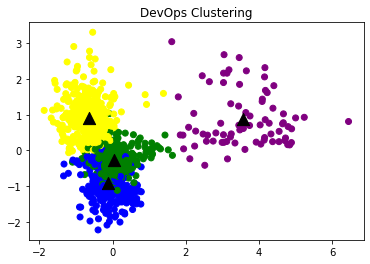

In [270]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure
plt.title('DevOps Clustering')
label1 = ['#FFFF00', '#008000', '#0000FF', '#800080' ,'#87cf5f', '#c48e34', '#6df68d', '#25f4c4', '#42cb08', '#e131fd', '#3033ad']
color = [label1[i] for i in labels]
plt.scatter(datapoint[:, 0], datapoint[:, 1], c=color)
centroids = kmeans_model.cluster_centers_
centroidpoint = pca.transform(centroids)
plt.scatter(centroidpoint[:, 0], centroidpoint[:, 1], marker='^', s=150, c='#000000')
plt.show()

In [115]:
l

array([1, 3, 0, ..., 1, 0, 1])

In [127]:
sents = df_devops['complete_text'][0].split()
targets = d2v_model_devops.infer_vector(sents)

In [128]:
kmeans_model.predict([targets.astype('double')])

array([1])

# Backend Developer

In [271]:
LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train_backend_developer = []
j=0
for em in df_backend_developer['complete_text'].values:
    all_content_train_backend_developer.append(LabeledSentence1(em,[j]))
    j+=1
print('Number of texts processed: ', j)

Number of texts processed:  1666


In [272]:
d2v_model_backend_developer = Doc2Vec(all_content_train_backend_developer, vector_size = 100, window = 10, min_count = 500, workers=7, dm = 1,alpha=0.025, min_alpha=0.001)
d2v_model_backend_developer.save('doc2vec_8.model')

In [369]:
kmeans_model = KMeans(n_clusters=4, init='k-means++', max_iter=100) 
X = kmeans_model.fit(d2v_model_backend_developer.dv.vectors.astype('double'))
labels=kmeans_model.labels_.tolist()
l = kmeans_model.fit_predict(d2v_model_backend_developer.dv.vectors.astype('double'))
pca = PCA(n_components=2).fit(d2v_model_backend_developer.dv.vectors.astype('double'))
datapoint = pca.transform(d2v_model_backend_developer.dv.vectors.astype('double'))
df_backend_developer['kmeans_labels'] = labels


array([-0.018984  , -0.25506596])

In [370]:
df_backend_developer

,Unnamed: 0,name_vacancy,salary,name_company,location_company,location_company_link,required_experience,busyness,description,key_skills,vacancy_url,all_feature_text,complete_text,kmeans_labels
0,0,Backend Developer (Python),з/п не указана,ТОО FREEDOM MOBILE,Алматы,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Разработка ветки диалога в системе. Создание п...,JavaScript Git CSS3 HTML5 Linu,https://hh.ru/vacancy/54611354?from=vacancy_se...,Название вакансии: Backend Developer (Python)....,название вакансия : backend developer ( python...,1
1,1,Backend Java developer (middle/senior),з/п не указана,ООО СЕУСЛАБ,"Пермь, шоссе Космонавтов, 111к3",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Обязанности: проектирование, разработка и реф...",Hibernate ORM Spring Framework Java Apache Tom...,https://hh.ru/vacancy/55173580?from=vacancy_se...,Название вакансии: Backend Java developer (mid...,название вакансия : backend java developer ( m...,1
2,2,QA Engineer (Backend),з/п не указана,Тинькофф,"Водный стадион, Москва, Головинское шоссе, 5А",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Самостоятельное проведение функционального и а...,Английский — A1 — Начальный SQL Функциональное...,https://hh.ru/vacancy/54901120?from=vacancy_se...,Название вакансии: QA Engineer (Backend). Зарп...,название вакансия : qa engineer ( backend ) . ...,1
3,3,Backend .NET Developer,з/п не указана,Scand,Минск,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Приглашаем .NET-разработчика для работы на про...,Английский — B2 — Средне-продвинутый AngularJS...,https://hh.ru/vacancy/55216624?from=vacancy_se...,Название вакансии: Backend .NET Developer. Зар...,название вакансия : backend .net developer . з...,3
4,4,Главный программист/ Архитектор ПО (Lead Java ...,з/п не указана,ООО СЕУСЛАБ,"Пермь, шоссе Космонавтов, 111к3",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: более 6 лет,"Полная занятость, полный день","Обязанности: Проектирование, разработка и рефа...",Java Spring Framework Hibernate ORM Git Систем...,https://hh.ru/vacancy/54995220?from=vacancy_se...,Название вакансии: Главный программист/ Архите...,название вакансия : главный программист/ архи...,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1661,1661,Тимлид группы бэкенд разработчиков,от 120 000 до 150 000 KGS на руки,ООО Прокси Сервис,Бишкек,https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день","Компания Для компании ""Кумтор Голд Компани"". ...",Английский — B2 — Средне-продвинутый JavaScrip...,https://hh.ru/vacancy/54945013?from=vacancy_se...,Название вакансии: Тимлид группы бэкенд разраб...,название вакансия : тимлид группа бэкенд разра...,0
1662,1662,Программис/Back-end php разработчик,от 1 000 USD до вычета налогов,СП НОУ Университет Пучон в Ташкенте,"Ташкент, 2-я улица Катартал, 38А",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Обязанности: Опыт проектирования и разработки...,MySQL Git ООП PostgreSQL Linux Cakephp RESTful...,https://hh.ru/vacancy/55136928?from=vacancy_se...,Название вакансии: Программис/Back-end php раз...,название вакансия : программис / back - end ph...,1
1663,1663,Full stack (Frond-end / back-end) разработчик ...,от 150 000 до 350 000 KZT на руки,ТОО АбАз,"Нур-Султан (Астана), проспект Мангилик Ел, С4/6",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Oilan.io- маркетплейс по поиску и подбору обра...,Умение эффективно планировать свое время Java ...,https://hh.ru/vacancy/54897251?from=vacancy_se...,Название вакансии: Full stack (Frond-end / bac...,название вакансия : full stack ( frond - end /...,1
1664,1664,Бэк энд разработчик,от 5 000 000 до 10 000 000 сум до вычета налогов

In [ ]:
pk.dump(kmeans_model, open("model_main_8.pkl","wb"))
pk.dump(pca, open('model_pca_8.pkl', 'wb'))

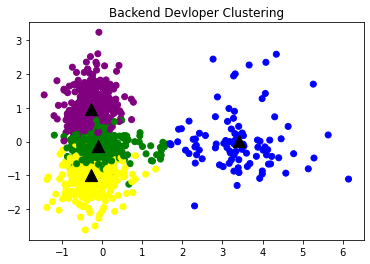

In [274]:
import matplotlib.pyplot as plt
%matplotlib inline
plt.figure
plt.title('Backend Devloper Clustering')
label1 = ['#FFFF00', '#008000', '#0000FF', '#800080' ,'#87cf5f', '#c48e34', '#6df68d', '#25f4c4', '#42cb08', '#e131fd', '#3033ad']
color = [label1[i] for i in labels]
plt.scatter(datapoint[:, 0], datapoint[:, 1], c=color)
centroids = kmeans_model.cluster_centers_
centroidpoint = pca.transform(centroids)
plt.scatter(centroidpoint[:, 0], centroidpoint[:, 1], marker='^', s=150, c='#000000')
plt.show()

In [221]:
l

array([0, 0, 0, ..., 0, 0, 3])

In [193]:
sents = df_backend_developer['complete_text'][0].split()
targets = d2v_model_backend_developer.infer_vector(sents)

In [194]:
kmeans_model.predict([targets.astype('double')])

array([1])

In [ ]:
df_data_science = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Data_Science.csv', encoding='utf-8')
df_data_engineer = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Data_Engineer.csv', encoding='utf_8')
df_product_manager = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Product_Manager.csv', encoding='utf_8')
df_smm_manager = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\SMM_Manager.csv', encoding='utf_16')
df_marketing_manager = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Marketing_Manager.csv', encoding='utf_16')
df_frontend_developer = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Frontend_Developer.csv', encoding='utf_16')
df_devops = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\DevOps.csv', encoding='utf_16')
df_backend_developer = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\BackEnd_Developer.csv', encoding='utf_16')

,Unnamed: 0,name_vacancy,salary,name_company,location_company,location_company_link,required_experience,busyness,description,key_skills,vacancy_url,all_feature_text,complete_text
0,0,Маркетолог,от 500 000 KZT на руки,ТОО Harmonia,Алматы,NaN,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день",Обязанности: Изучение рынка и рыночных тенд...,ATL BTL Маркетинговые исследования Маркетингов...,https://hh.ru/vacancy/55235310?from=vacancy_se...,Название вакансии: Маркетолог. Зарплата: от 50...,название вакансия : маркетолог . зарплата : от...
1,1,Маркетолог/Автоворонщик в онлайн-школу,от 50 000 руб. до вычета налогов,Евразийская Академия Предпринимательства,Москва,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, удаленная работа",В онлайн-школу Евразийская Академия Предприним...,Работа в команде Грамотность Поиск информации ...,https://hh.ru/vacancy/55198346?from=vacancy_se...,Название вакансии: Маркетолог/Автоворонщик в о...,название вакансия : маркетолог / автоворонщик ...
2,2,Интернет-маркетолог (Chief Marketing Officer),от 150 000 до 300 000 руб. на руки,ООО ЛИАНО,"Москва, 2-я Хуторская улица, 38А",https://hh.ru/search/vacancy/map?vacancy_id=55...,Требуемый опыт работы: 3–6 лет,"Полная занятость, полный день","Внимание, нужен специалист в офис, удаленный р...",Интернет-реклама Маркетинговый анализ E-Mail M...,https://hh.ru/vacancy/55231567?from=vacancy_se...,Название вакансии: Интернет-маркетолог (Chief ...,название вакансия : интернет - маркетолог ( ch...
3,3,Менеджер по маркетингу,от 300 000 до 585 000 KZT на руки,ТОО DALEX DEVELOPMENT,"Райымбек батыра, Алматы, улица Грибоедова, 66",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Обязанности: Управляет процессами лидогенерац...,Создание лендингов Лендинг Коммуникация PR-кон...,https://hh.ru/vacancy/54509048?from=vacancy_se...,Название вакансии: Менеджер по маркетингу. Зар...,название вакансия : менеджер по маркетинг . за...
4,4,Marketing account manager,от 2 000 до 3 000 USD на руки,Coin Liquidity Solutions,Москва,NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Coin Liquidity Solutions is a fintech company ...,Английский — C1 — Продвинутый Английский язык ...,https://hh.ru/vacancy/54801853?from=vacancy_se...,Название вакансии: Marketing account manager. ...,название вакансия : marketing account manager ...
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1047,1047,Менеджер по маркетингу,з/п не указана,FitnesShock,"Тольятти, Транспортная улица, 26с3",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Комплексное развитие сайта Компании и его прод...,Локальные бренды Деловая переписка Документооб...,https://hh.ru/vacancy/54746662?from=vacancy_se...,Название вакансии: Менеджер по маркетингу. Зар...,название вакансия : менеджер по маркетинг . за...
1048,1048,Маркетолог/Seo-специалист,от 50 000 до 80 000 руб. на руки,WEBzavod.bz,"Санкт-Петербург, Чкаловская",NaN,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день","Работаешь, развиваешься в маркетинге ? «WEBz...",Интернет-реклама Контекстная реклама Adobe Pho...,https://hh.ru/vacancy/55167336?from=vacancy_se...,Название вакансии: Маркетолог/Seo-специалист. ...,название вакансия : маркетолог / seo - специал...
1049,1049,Менеджер по маркетингу,з/п не указана,FitnesShock,"Тольятти, Транспортная улица, 26с3",https://hh.ru/search/vacancy/map?vacancy_id=54...,Требуемый опыт работы: 1–3 года,"Полная занятость, полный день",Комплексное развитие сайта Компании и его прод...,Локальные бренды Деловая переписка Документооб...,https://hh.ru/vacancy/54746662?from=vacancy_se...,Название вакансии: Менеджер по маркетингу. Зар...,название вакансия : менеджер по маркетинг . за...
1050,1050,Специалист отдела маркетинга,от 30 000 руб. до вычета налогов,АО СПЕЦПРИБОР,"Тула, улица Болдина, 94",https://hh.ru/search/vacancy/map?vacancy_id=34...,Требуемый опыт работы: 1–3 года,"П

# Классификация

In [25]:
df_train = pd.read_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\Train.csv', encoding='utf_16')

In [26]:
df_train

,Unnamed: 0,all_texts,number_profession,cluster_number_kmean
0,0,название вакансия : machine learning engineer ...,1,1
1,1,название вакансия : разработчик machine learni...,1,3
2,2,название вакансия : machine learning engineer ...,1,21
3,3,название вакансия : machine learning and compu...,1,21
4,4,название вакансия : data scientist / machine l...,1,11
...,...,...,...,...
7936,7936,название вакансия : тимлид группа бэкенд разра...,8,16
7937,7937,название вакансия : программис / back - end ph...,8,34
7938,7938,название вакансия : full stack ( frond - end /...,8,34
7939,7939,название вакансия : бэк энд разработчик . зарп...,8,15


In [27]:
LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
all_content_train = []
j=0
for em in df_train['all_texts'].values:
    all_content_train.append(LabeledSentence1(em,[j]))
    j+=1
print('Number of texts processed: ', j)

Number of texts processed:  7941


In [33]:
y = df_train['number_profession']

In [28]:
d2v_model_train = Doc2Vec(all_content_train, vector_size = 100, window = 10, min_count = 500, workers=7, dm = 1,alpha=0.025, min_alpha=0.001)

In [29]:
d2v_model_train.build_vocab(all_content_train)
d2v_model_train.train(all_content_train, total_examples=d2v_model_train.corpus_count, epochs=10)

In [30]:
from sklearn.model_selection import train_test_split

In [51]:
X_train, X_test, y_train, y_test = train_test_split(d2v_model_train.dv.vectors, y, test_size=0.10, random_state=42)

In [52]:
X_train

array([[ 0.21462883,  0.0310814 ,  0.4372369 , ...,  0.04759543,
         0.9387737 , -0.20181185],
       [-0.52158564, -0.13049257,  0.9537538 , ..., -0.3541371 ,
         0.80356854,  0.14776818],
       [-0.3778102 ,  0.01414041,  0.47906342, ..., -0.17018859,
         0.7243449 ,  0.03269111],
       ...,
       [ 0.12367129,  0.16869487,  0.22564524, ..., -0.26930797,
         0.5730172 , -0.2274367 ],
       [-0.4432811 ,  0.5470768 , -0.02436167, ..., -0.4260296 ,
         0.48028523,  0.50535846],
       [ 0.20106897, -0.19559592,  0.07608727, ...,  0.19072898,
         0.2163229 ,  0.08624353]], dtype=float32)

In [53]:
y_train

1172    3
1025    3
2208    4
2149    4
7662    8
       ..
5226    7
5390    7
860     2
7603    8
7270    8
Name: number_profession, Length: 7146, dtype: int64

In [54]:
X_test

array([[ 0.10706843,  0.3287339 ,  0.5958849 , ...,  0.3846132 ,
         0.26756844, -0.0712026 ],
       [ 0.08348664,  0.07718543,  0.0299336 , ..., -0.02467873,
         0.5007179 ,  0.00451761],
       [ 0.50598717,  0.10481806, -0.04250684, ...,  0.4762644 ,
         1.1065587 , -0.23931372],
       ...,
       [-0.06701155,  0.1395724 ,  0.39820755, ..., -0.05656824,
         0.3443992 , -0.22950806],
       [ 0.18160589, -0.10513837, -0.08701092, ...,  0.07347345,
         0.5322854 , -0.06594773],
       [-0.20553522,  0.059281  ,  0.40908372, ..., -0.18031225,
         0.18750161, -0.10494532]], dtype=float32)

In [55]:
y_test

7788    8
7752    8
334     1
6036    7
4717    6
       ..
6163    7
3404    5
3268    5
6183    7
1123    3
Name: number_profession, Length: 795, dtype: int64

In [56]:
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

In [57]:
SVC_model = SVC()
KNN_model = KNeighborsClassifier(n_neighbors=8)

In [58]:
SVC_model.fit(X_train, y_train)
KNN_model.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=8)

In [59]:
SVC_prediction = SVC_model.predict(X_test)
KNN_prediction = KNN_model.predict(X_test)



In [60]:
SVC_prediction

array([8, 8, 8, 3, 6, 5, 3, 3, 7, 3, 7, 6, 8, 5, 8, 3, 5, 3, 6, 3, 1, 7,
       7, 7, 8, 4, 8, 5, 7, 5, 8, 6, 3, 6, 8, 5, 7, 6, 5, 3, 7, 8, 8, 6,
       5, 6, 5, 8, 7, 2, 3, 1, 6, 3, 1, 5, 6, 1, 7, 7, 3, 6, 5, 5, 8, 8,
       2, 8, 7, 1, 7, 1, 6, 6, 3, 7, 5, 1, 2, 3, 8, 6, 6, 3, 7, 2, 8, 6,
       3, 8, 5, 6, 7, 3, 1, 8, 5, 3, 5, 4, 6, 1, 8, 7, 5, 7, 6, 1, 7, 6,
       2, 3, 7, 3, 3, 7, 5, 8, 6, 7, 1, 1, 3, 8, 6, 8, 5, 6, 6, 7, 8, 8,
       5, 1, 8, 6, 8, 2, 7, 3, 8, 8, 6, 8, 5, 1, 1, 8, 8, 7, 7, 6, 5, 8,
       6, 1, 7, 8, 8, 1, 3, 8, 8, 6, 1, 8, 1, 5, 6, 3, 6, 3, 3, 7, 5, 5,
       7, 5, 6, 5, 3, 6, 1, 7, 7, 3, 6, 8, 8, 1, 8, 5, 6, 8, 1, 8, 5, 2,
       7, 6, 4, 6, 5, 7, 8, 8, 5, 8, 6, 7, 7, 5, 3, 8, 3, 7, 1, 8, 3, 7,
       1, 3, 6, 8, 8, 5, 5, 8, 6, 3, 5, 3, 8, 8, 7, 6, 5, 6, 7, 8, 5, 6,
       7, 3, 6, 5, 5, 8, 7, 8, 5, 7, 6, 7, 8, 7, 6, 5, 1, 3, 3, 1, 3, 7,
       6, 7, 8, 3, 7, 3, 7, 6, 6, 8, 5, 6, 6, 6, 2, 3, 3, 6, 3, 3, 6, 8,
       6, 3, 3, 7, 3, 8, 1, 5, 8, 6, 8, 8, 3, 8, 3,

In [61]:
a = 1
a

1

In [62]:
y_test

7788    8
7752    8
334     1
6036    7
4717    6
       ..
6163    7
3404    5
3268    5
6183    7
1123    3
Name: number_profession, Length: 795, dtype: int64

In [63]:
from sklearn.metrics import accuracy_score
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [64]:
len(y_test)

795

In [70]:
print(accuracy_score(SVC_prediction, y_test, normalize=False))
print(accuracy_score(KNN_prediction, y_test, normalize=False))
# But Confusion Matrix and Classification Report give more details about performance
print(confusion_matrix(SVC_prediction, y_test))
print(confusion_matrix(KNN_prediction, y_test))


649
560
[[ 50  12   5   0   0   0   0   1]
 [  1  12   2   0   0   0   0   0]
 [  9   4 104  20   8   0   1   0]
 [  0   0   1   8   3   0   0   0]
 [  0   0   6  12  82   4   0   1]
 [  0   0   1   0   7 120  14   0]
 [  0   0   0   0   0  12 110   8]
 [  6   0   1   0   1   0   6 163]]
[[ 42  12   8   1   1   0   1   1]
 [  8  12   0   0   0   0   0   1]
 [  3   3  93  12  11   2   1   3]
 [  2   0   1  12   7   0   0   0]
 [  0   0  11  14  74  24   6   3]
 [  0   0   0   1   8 105  27   2]
 [  2   0   1   0   0   5  80  21]
 [  9   1   6   0   0   0  16 142]]


In [66]:
print(classification_report(SVC_prediction, y_test))

              precision    recall  f1-score   support

           1       0.76      0.74      0.75        68
           2       0.43      0.80      0.56        15
           3       0.87      0.71      0.78       146
           4       0.20      0.67      0.31        12
           5       0.81      0.78      0.80       105
           6       0.88      0.85      0.86       142
           7       0.84      0.85      0.84       130
           8       0.94      0.92      0.93       177

    accuracy                           0.82       795
   macro avg       0.72      0.79      0.73       795
weighted avg       0.85      0.82      0.83       795



In [67]:
print(classification_report(KNN_prediction, y_test))

              precision    recall  f1-score   support

           1       0.64      0.64      0.64        66
           2       0.43      0.57      0.49        21
           3       0.78      0.73      0.75       128
           4       0.30      0.55      0.39        22
           5       0.73      0.56      0.64       132
           6       0.77      0.73      0.75       143
           7       0.61      0.73      0.67       109
           8       0.82      0.82      0.82       174

    accuracy                           0.70       795
   macro avg       0.63      0.67      0.64       795
weighted avg       0.72      0.70      0.71       795



In [68]:
'''from sklearn import preprocessing
from sklearn.cluster import KMeans

kmeans = KMeans().fit(preprocessing.normalize(X))
Один из вариантов '''

'from sklearn import preprocessing\nfrom sklearn.cluster import KMeans\n\nkmeans = KMeans().fit(preprocessing.normalize(X))\nОдин из вариантов '

In [69]:
df_frontend_developer['all_feature_text'][0]

KeyError: 'all_feature_text'

In [201]:
df_frontend_developer['complete_text'][0]

'название вакансия : frontend - разработчик ( + pixijs ) . зарплата : от 80 000 руб. на рука . название компания арбина . требуемый опыт требуемый опыт работа : 1–3 год . занятость полный занятость , полный день . описание вакансия о нас мы - небольшой команда из пенза , которая создать продукт , стать популярный среди десяток миллион ребёнок , подросток и взрослый по весь мир . наш пользователь , в основный , из сша , канада , великобритания и россия . мы превращать обычный пиксель - арт в добрый и полезный досуг - раскраску , и за время существование продукт набрать более 2 миллион отличный оценка в appstore и google play . наш основной продукт , sandbox , дать импульс появление тысяча похожий приложение в магазин приложение . кроме того , мы были номинированы на google play user ’s choice app . задача вы будете создавать и поддерживать клиентский часть компонент внутренний инфраструктура : форум , бот , сервис внутренний бизнес - процессов . требование - исследоват

In [645]:
def get_class(text):
    LabeledSentence1 = gensim.models.doc2vec.TaggedDocument
    all_content_train = []
    j=0
    for em in df_train['all_texts'].values:
        all_content_train.append(LabeledSentence1(em,[j]))
        j+=1
    print('Number of texts processed: ', j)
    j+=1
    all_content_train.append(LabeledSentence1(text,[j]))
    d2v_model_train = Doc2Vec(all_content_train, vector_size = 100, window = 10, min_count = 500, workers=7, dm = 1,alpha=0.025, min_alpha=0.001)
    load_model_svc = pickle.load(open('model_main_svc.pkl', 'rb'))
    print(len(d2v_model_train.dv.vectors))
    vector = d2v_model_train.infer_vector(text, alpha=0.025, min_alpha=0.01, epochs=5)
    classif = load_model_svc.predict(d2v_model_train.dv.vectors.astype('double'))    
    return vector, classif    

In [295]:
def get_cluster_and_text_coor(text_vector, text_class):
    name_model = 'model_main_' + str(text_class) + '.pkl'
    name_model_pca = 'model_pca_' + str(text_class) + '.pkl'
    loaded_model_pca = pickle.load(open(name_model_pca,'rb'))
    loaded_model = pickle.load(open(name_model, 'rb'))
    result_clustering = loaded_model.predict([text_vector.astype('double')])
    result_pca = loaded_model_pca.transform([text_vector])
    return result_clustering, result_pca

In [385]:
def lemm_text(text):
    import unicodedata
    from string import punctuation
    russian_stopwords = stopwords.words("russian")
    rdy_tmp = []
    tmp_str = str()
    tmp = []
    doc = nlp(text)
    for token in doc:
        tmp.append(token.lemma_)
    tmp_str = ' '.join(tmp)
    tmp_str = unicodedata.normalize("NFKD", tmp_str)
    tmp_str = tmp_str.replace('   ', ' ')
    rdy_tmp.append(tmp_str)
    return rdy_tmp

In [ ]:
import unicodedata
from string import punctuation
russian_stopwords = stopwords.words("russian")
rdy_tmp = []
for i in range(0, len(df_backend_developer['all_feature_text'])):
    tmp_str = str()
    tmp = []
    doc = nlp(df_backend_developer['all_feature_text'][i])
    for token in doc:
        tmp.append(token.lemma_)
    tmp_str = ' '.join(tmp)
    tmp_str = unicodedata.normalize("NFKD", tmp_str)
    tmp_str = tmp_str.replace('   ', ' ')
    rdy_tmp.append(tmp_str)
    

In [457]:
def get_link(classif, cluster, pca_coor):
    from math import sqrt
    name_df = 'C:\\Users\\slubo\\Desktop\\Diplom_CSV\\df_'+str(classif[0])+'.csv'
    name_model = 'model_main_' + str(classif[0]) + '.pkl'
    name_model_pca = 'model_pca_' + str(classif[0]) + '.pkl'
    name_model_doc2vec = 'doc2vec_' + str(classif[0]) +'.model'
    
    id_arr = []
    df = pd.read_csv(name_df)
    loaded_model_pca = pickle.load(open(name_model_pca,'rb'))
    loaded_model = pickle.load(open(name_model, 'rb'))
    loaded_model_doc2vec = Doc2Vec.load(name_model_doc2vec)
    
    datapoint = loaded_model_pca.transform(loaded_model_doc2vec.dv.vectors.astype('double'))
    result_vector_arr = []
    for i in range(len(loaded_model.labels_)):
        if cluster == loaded_model.labels_[i]:
            id_arr.append(i)
    for i in range(datapoint[loaded_model.labels_ == cluster].shape[0]):
        result_vector_arr.append((sqrt(np.sum((pca_coor[0] - datapoint[loaded_model.labels_ == cluster][i])**2)), id_arr[i]))
    result_vector_arr.sort()
    link_id = []
    for i in range(5):
        link_id.append(result_vector_arr[i][1])
    links = df.iloc[link_id]['vacancy_url']
    link_array = []
    for link in links:
        link_array.append(link)
    return link_array
    
    

In [671]:
text = lemm_text(
    df_product_manager['all_feature_text'][100])

In [672]:
text

['название вакансия : категорийный менеджер / product manager . зарплата : от 120 000 до 200 000 руб. на рука . название компания ооо электропоставщик . требуемый опыт требуемый опыт работа : 3–6 год . занятость полный занятость , удалённый работа . описание вакансия кабель . рф ® сегодня – один из ведущий интернет - проектов по продажа электротехнический и общепромышленный продукция в россия и страна снг . официальный сотрудничество с надёжный производитель и поставщик позволить наш компания стать мультибрендовой площадка , реализовать широкий спектр товар : кабельный - проводниковый продукция ; продукция для монтаж и прокладка кабель ; электродвигатель ; подшипник ; транспортёрный лента ; рукав и шланг ; ремень приводной ; шкив ; цепь ; звёздочка ; муфта приводной ; низковольтный оборудование ; теплотехника ; редуктор ; насос ; вентилятор ; кабельный лоток и короб ; кабельный муфта ; опора . более 13 год опыт позволить нам стать надёжный партнёр для ключев

In [680]:
a, b = get_class([df_frontend_developer['all_feature_text'][100]])

Number of texts processed:  7941
7943


In [681]:
b

array([2, 2, 3, ..., 3, 3, 3], dtype=int64)

In [682]:
a, b[-3:]

(array([-6.6093862e-04, -3.2430661e-03, -4.1854352e-04,  3.7956845e-03,
        -3.9709629e-03,  1.9336438e-03, -3.5661599e-03, -8.4907858e-04,
         4.0580886e-03, -3.7686145e-03, -2.4304902e-03,  1.6903758e-04,
         3.6058920e-03, -1.5886989e-03, -2.7391636e-03, -3.6360959e-03,
         3.2869137e-03,  3.5275656e-03, -4.6766875e-03,  3.6011999e-03,
        -4.6562462e-04,  1.0965985e-03, -1.9786377e-03,  4.0136166e-03,
        -2.5519494e-03,  3.6693979e-03,  1.9308925e-03,  3.6647713e-03,
        -1.8060422e-03,  2.0309477e-03, -1.4193123e-03, -7.2109164e-04,
         8.8401437e-05, -9.0318738e-04,  3.7432367e-03, -3.3917784e-04,
         4.1996660e-03, -3.2905561e-03, -1.3015881e-03,  2.6037865e-03,
        -3.2610386e-03, -1.9160956e-04, -4.3223831e-03, -1.9932901e-03,
         7.0076884e-04,  8.4030034e-05, -2.9422962e-03,  4.6881442e-03,
         1.9966925e-03, -4.3403949e-03,  3.3225249e-03, -3.6828727e-03,
        -2.1548516e-03, -3.3356450e-03,  7.3977350e-04,  3.46599

In [636]:
c, d = get_cluster_and_text_coor(a, b[0])

In [637]:
c, d[0]

(array([0]), array([-0.51819558,  0.14274164]))

In [638]:
tmp = get_link(b, c, d)

In [639]:
tmp

['https://hh.ru/vacancy/54793261?from=vacancy_search_list&hhtmFrom=vacancy_search_list&query=Product%20manager',
 'https://hh.ru/vacancy/55182523?from=vacancy_search_list&hhtmFrom=vacancy_search_list&query=Product%20manager',
 'https://hh.ru/vacancy/45699724?from=vacancy_search_list&hhtmFrom=vacancy_search_list&query=Product%20manager',
 'https://hh.ru/vacancy/54243687?from=vacancy_search_list&hhtmFrom=vacancy_search_list&query=Product%20manager',
 'https://hh.ru/vacancy/55228236?from=vacancy_search_list&hhtmFrom=vacancy_search_list&query=Product%20manager']

In [448]:
tmp

[(0.022003277972744095, 882),
 (0.059399598623731516, 854),
 (0.061345522112277895, 868),
 (0.0637795657089372, 372),
 (0.08957360208271498, 481),
 (0.09021291253501142, 752),
 (0.09229686750164387, 1051),
 (0.10710710325092798, 781),
 (0.10730101820357864, 139),
 (0.12532245660775299, 999),
 (0.13121338540748081, 838),
 (0.13267946753706142, 376),
 (0.1356453250580444, 451),
 (0.13906978214921015, 771),
 (0.14782487224821564, 1095),
 (0.15375101432169405, 606),
 (0.16013286941084268, 207),
 (0.16341416898255098, 794),
 (0.1713986755330976, 225),
 (0.17189940817163718, 909),
 (0.17932909110680859, 46),
 (0.17943820161149088, 1111),
 (0.1810291530536679, 569),
 (0.18129329392675428, 595),
 (0.18297869881535006, 1104),
 (0.18667782654162626, 655),
 (0.1908093139750958, 394),
 (0.19450360568191902, 610),
 (0.1956880090616425, 885),
 (0.19721884470887885, 183),
 (0.20030601037055107, 4),
 (0.2010577375450592, 1089),
 (0.20119014369148336, 18),
 (0.20143656816767133, 385),
 (0.2054268115189

In [430]:
tmp[0][0]

array([0.14538691, 0.16450754])

In [422]:
tmp[0][0]

array([ 0.38129635, -0.40559529])

In [223]:
def get_vacancy():
    pass

SyntaxError: unexpected EOF while parsing (<ipython-input-223-87639e7fe43a>, line 1)

In [234]:
model = Doc2Vec.load('doc2vec.model')


In [235]:
pca = PCA(n_components=2).fit(model.dv.vectors.astype('double'))

In [236]:
model.dv.vectors

array([[ 0.04954812, -0.32530236, -0.26912764, ...,  0.07680997,
        -0.18295248, -0.14062141],
       [-0.01142126,  0.5690468 ,  0.21218872, ..., -0.03948628,
        -0.15230064, -0.08742561],
       [ 0.01981343,  0.41618288,  0.30328733, ..., -0.02482593,
        -0.20674792,  0.09461705],
       ...,
       [ 0.21101955, -0.17420678, -0.01541662, ...,  0.12339012,
        -0.05218972,  0.2095371 ],
       [-0.01457331,  0.04015402,  0.02369156, ..., -0.0685499 ,
        -0.08572157,  0.18817562],
       [ 0.12580784, -0.06919332, -0.07814034, ..., -0.09425963,
         0.01320048, -0.12213366]], dtype=float32)

In [371]:
df_data_science.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\df_1.csv', encoding='utf-8')
df_data_engineer.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\df_2.csv', encoding='utf_8')
df_product_manager.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\df_3.csv', encoding='utf_8')
df_smm_manager.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\df_4.csv', encoding='utf_16')
df_marketing_manager.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\df_5.csv', encoding='utf_16')
df_frontend_developer.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\df_6.csv', encoding='utf_16')
df_devops.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\df_7.csv', encoding='utf_16')
df_backend_developer.to_csv('C:\\Users\\slubo\\Desktop\\Diplom_CSV\\df_8.csv', encoding='utf_16')

In [683]:
d2v_model_train[df_data_science['all_feature_text'][0]]

KeyError: "Key 'Название вакансии: Machine Learning Engineer (ML, Infrastructure). Зарплата: от 3\xa0000 EUR на руки. Название компании Greenscreens.AI. Требуемый опыт Требуемый опыт работы: 3–6 лет. Занятость Полная занятость, удаленная работа. Описание вакансии Greenscreens.ai is SaaS platform offering ML and Data Science-based freight price predictions for the US logistics market. We are a fast growing company and we recently raised a round of investment A. Part of engineering team work from an office in Vilnius, part remotely from Russia. Headquarter, sales, analytics and support in the US https://greenscreens.ai/ We are looking for a ML Engineer to grow and develop both ML engine and infrastructure parts of our system Responsibilities  Scale existing models and optimize performance (RPS, memory consumption) Work to automate AI/ML pipelines and cover end-to-end model’s lifecycle Build an infrastructure for training models and managing experiments Participate in the process for continuous improvement for Rate Engine by manipulation with different algorithms, experimenting with new features and their encoding, filtering data Responsible for helping with building learning pipelines (import, filter, train, deploy) using Python, TensorFlow, SKLearn, and SQL Development of complex business logic in Python, which is needed to integrate machine learning models into business processes  Skills  3+ years work experience as a Data Scientist/ML Engineer or similar role Familiar with Python (jupyter notebook, pandas, numpy) Experience with popular ML frameworks (tensorflow, sklearn) Knowledge of main ML algorithms (NNs, xgboost, random forest, linear regression) Experience with PostgreSQL; Using Unit Testing in Development Nice to have experience in designing REST APIs, Git, Microservices Nice to have experience with Docker and Kubernetes, AWS/GCP Nice to have experience with CICD pipelines and DevOps/DevSecOps engineering  Nice to have experience with C++, Rust, or any other low-level language   We offer:  Salary in Euro Options in a fast growing startup Remote work . Ключевые навыки Английский\xa0— B1 — Средний ML Gitlab CI AWS Machine Learning Docker CI/CD ООП Design Patterns Git Microservices Data Mining Python Kubernetes PostgreSQL SQ. ' not present"